In [1]:
import sys
sys.path.append("..") 

import pandas as pd
import numpy as np
import xarray as xr

import pymc as pm
import pytensor.tensor as pt
import matplotlib.pyplot as plt
import arviz as az

from scipy import sparse
from scipy.linalg import solve
from scipy.sparse.linalg import spsolve

from libpysal.weights import KNN, fuzzy_contiguity, w_union, W
import networkx as nx
import warnings

config = {
    'figure.figsize':(14,4),
    'figure.constrained_layout.use':True,
    'figure.facecolor':'w',
    'axes.grid':False,
    'grid.linewidth':0.5,
    'grid.linestyle':'--',
    'axes.spines.top':False,
    'axes.spines.bottom':False,
    'axes.spines.left':False,
    'axes.spines.right':False
}

plt.rcParams.update(config)

SEED = sum(list(map(ord, 'climate_bayes')))
rng = np.random.default_rng(SEED)

In [2]:
from laos_gggi import load_shapefile
from laos_gggi.replication_data import create_replication_data
from laos_gggi.sample import sample_or_load

# Data loading and preparation

In [3]:
df = (create_replication_data()
        .rename(columns={'ISO':'iso'})
        .set_index(["iso", "year"]))

In [4]:
#Load shapefiles
world = (load_shapefile('world', repair_ISO_codes=True)
            .rename(columns={'ISO_A3':'iso'})
            .set_index('iso'))
laos = load_shapefile('laos')

## Dropping years without damages
We model the expected damages conditional to the occurrence of disasters, therefore we exclude the years without disasters

In [5]:
df_climatological = df.query('Total_Damage_Adjusted_clim > 0')
df_hydrometereological = df.query('Total_Damage_Adjusted_hydro > 0')

## Reconcile EMDAT and shapefile ISO codes

In [6]:
df_iso = df.index.get_level_values('iso').unique()
world_iso = world.index.unique()

In [7]:
# Codes in EMDAT but not in world
", ".join(list(set(df_iso) - set(world_iso)))

''

In [8]:
# Codes in shapefile but not in EMDAT
", ".join(list(set(world_iso) - set(df_iso)))

'ASM, VEN, SMR, SGS, VAT, CYM, GIB, MAF, LCA, ATG, PSE, NIU, SHN, PLW, MCO, TCA, GGY, KIR, FLK, MSR, TTO, FRO, JEY, BRB, VGB, GRL, VCT, LIE, CUW, PRK, CPV, MHL, KNA, COM, STP, GRD, IOT, HMD, SLB, GUM, SGP, DMA, SXM, QAT, MAC, PCN, MNP, BLM, COK, BHR, SYC, TON, BMU, MDV, ABW, FSM, MLT, JAM, ATF, LUX, TUV, UNK, IMN, CYP, WLF, PRI, HKG, AIA, SPM, NFK, BHS, ISR, NRU, AND, VIR'

In [9]:
# Drop codes not in both
common_codes = set(world_iso).intersection(set(df_iso))

df = df.query('iso in @common_codes').copy()
world = world.query('iso in @common_codes').copy()

In [10]:
# Get unique iso codes and years
code_idx, codes = pd.factorize(df.index.get_level_values("iso"), sort=True)
year_idx, years = pd.factorize(df.index.get_level_values("year"), sort=True)

disasters = ["climatological_disasters", "hydrological_disasters"]
damages = ['Total_Damage_Adjusted_hydro', 'Total_Damage_Adjusted_clim']

has_damage = df[damages] != 0
has_disaster = df[disasters] != 0

In [11]:
y = df[disasters].copy().astype(float)

In [12]:
y.values[np.where(has_damage.values & (~has_disaster.values))] = np.nan

# Helper Functions

In [13]:
def plot_predictions(idata, 
                     iso: str,
                     group: str = 'posterior_predictive',
                     var_name: str = 'y_hat',
                     obs_name: str | None = None,
                     data: pd.DataFrame | None = None,
                     **kwargs):
    if group not in ['prior', 'posterior', 'prior_predictive', 'posterior_predictive']:
        raise ValueError(f'Invalid group {group}')
    
    if obs_name and data is None:
        obs_df = idata.observed_data.sel(obs_iso=iso)[obs_name].to_dataframe()[obs_name].unstack('disaster')
    elif data is not None:
        obs_df = data.xs(level=0, key=iso)
        
    iso_idata = idata[group][var_name].sel(obs_iso = iso)
    mu = iso_idata.mean(dim=['chain', 'draw'])
    
    index = mu['obs_year'].values
    disasters = mu['disaster'].values
    
    fig, ax = plt.subplots(1, 2, **kwargs)
    
    for disaster, axis in zip(disasters, fig.axes):
        axis.plot(index, mu.sel(disaster=disaster).values, color='tab:blue')

        if obs_name:
            axis.plot(index, obs_df[disaster].values, color='k', marker='o')
    
        for hdi_prob in np.linspace(0.05, 0.95, 25)[::-1]:
            hdi = az.hdi(iso_idata.sel(disaster=disaster), hdi_prob=hdi_prob)[var_name]
            axis.fill_between(index, *hdi.values.T, color='tab:blue', alpha=0.1)
        axis.set(xlabel="Year", ylabel = "Disaster Count", title=f"{iso} {disaster.title()}")

    plt.show();
    

# Dumb Model

In [14]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0])
}

with pm.Model(coords=coords) as model0:
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])
    year_idx_pt = pm.Data('year_idx', year_idx, dims=['obs_idx'])
    
    year_loc = pm.Normal('year_loc', 0, 1, dims=['disaster'])
    year_effect = pm.Normal('year_effect', 0, 1, dims=['year', 'disaster'])
    country_effect = pm.ZeroSumNormal('country_effect', 1, dims=['iso', 'disaster'])
    
    latent_rate = year_effect[year_idx_pt] + country_effect[iso_idx_pt]
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    
    mu = pt.softplus(latent_rate)
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=mu,
                                            alpha=alpha,
                                            observed=y,
                                            dims=['obs_idx', 'disaster'])
    
    prior = pm.sample_prior_predictive().assign_coords(idx)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1288: RuntimeWarning: invalid value encountered in cast
  data = convert_observed_data(data).astype(rv_var.dtype)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1302: ImputationWarning: Data in y_hat contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, country_effect, y_hat_observed, y_hat_unobserved, year_effect, year_loc, zero_prob]


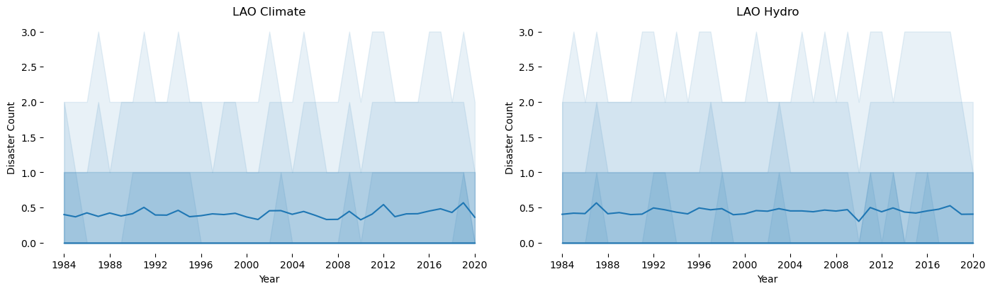

In [15]:
plot_predictions(prior, 'LAO', 'prior');

In [16]:
# Dictionary to store model results
results = {}

In [17]:
with model0:
    idata = sample_or_load(fp='idata/model_0_missing.nc',
                           sample_kwargs=dict(
                               init='jitter+adapt_diag_grad', 
                               cores=8,
                               chains=8, 
                               draws=250,
                               tune=250,
                               compile_kwargs={'mode':'NUMBA'},
                               ),
                           force_resample=False,
                           save_results=True,
                           compile_kwargs={'mode':'NUMBA'}
                          )
    idata = idata.assign_coords(idx)
    results['model0'] = idata

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>NUTS: [year_loc, year_effect, country_effect, zero_prob, alpha]
>Metropolis: [y_hat_unobserved]


Output()

Sampling 8 chains for 250 tune and 250 draw iterations (2_000 + 2_000 draws total) took 535 seconds.
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [y_hat_observed]


Output()

Output()

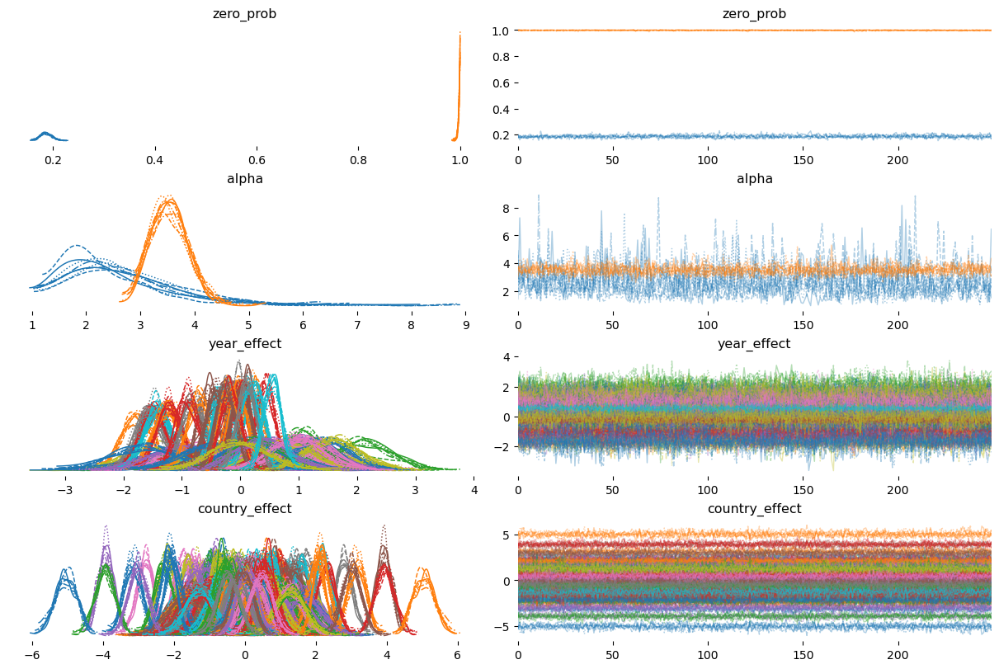

In [18]:
az.plot_trace(idata, var_names=['zero_prob', 'alpha', 'year_effect', 'country_effect']);

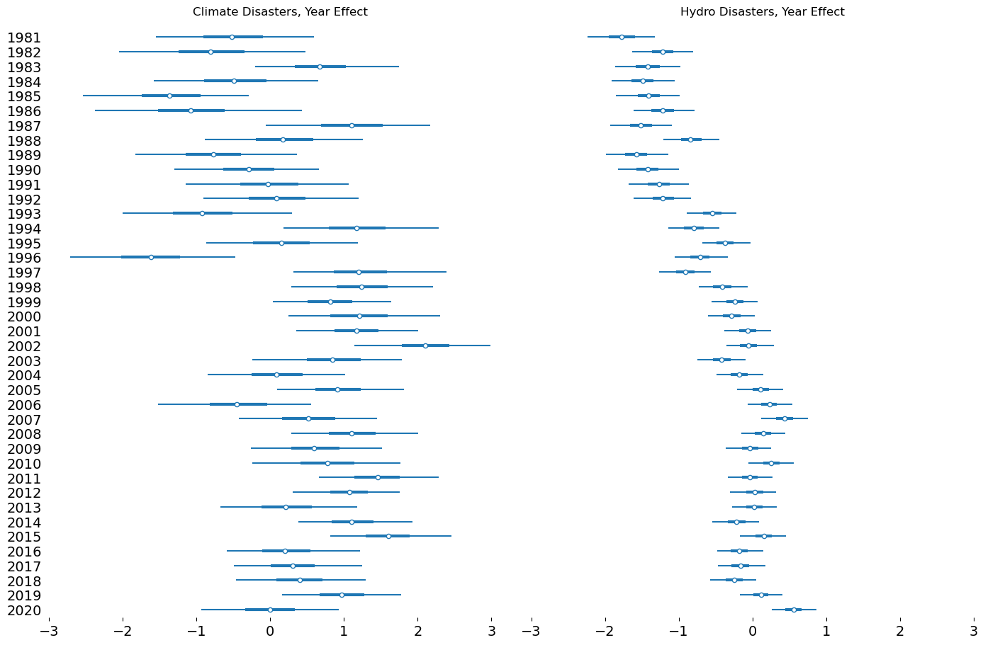

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['year_effect'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Year Effect")

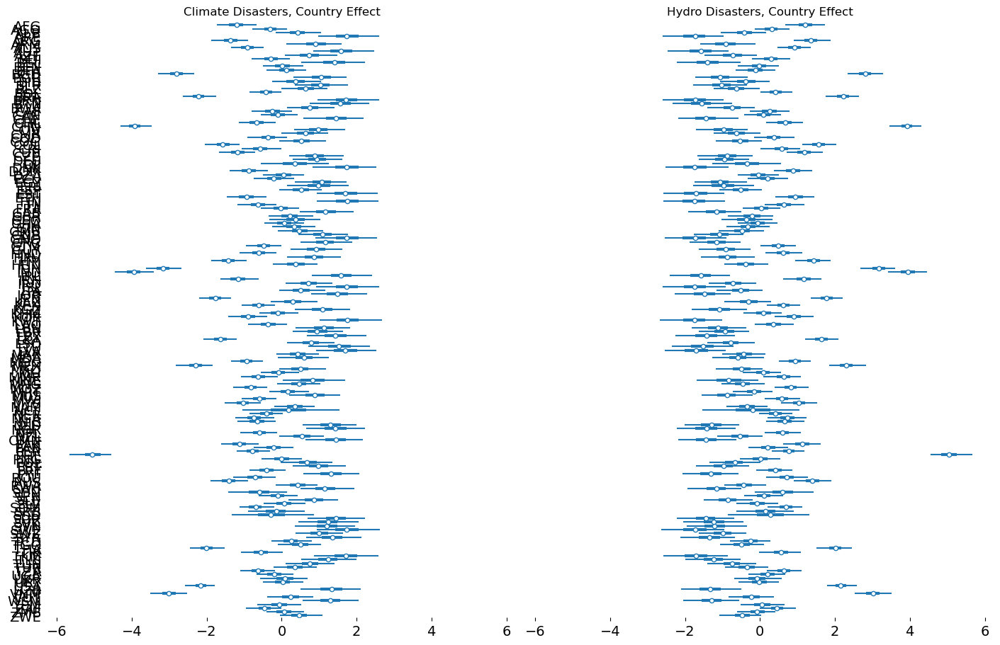

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['country_effect'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

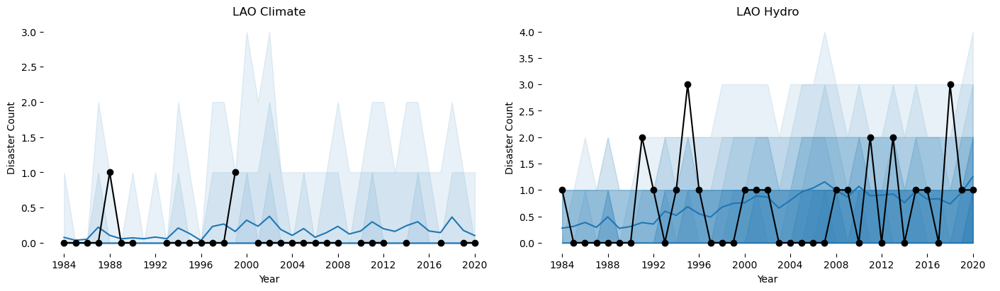

In [21]:
plot_predictions(idata, 
                 iso='LAO', 
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1))

# Partial Pooling

In [22]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0])
}

with pm.Model(coords=coords) as model1:
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])
    year_idx_pt = pm.Data('year_idx', year_idx, dims=['obs_idx'])
    
    year_loc = pm.Normal('year_loc', 0, 1, dims=['disaster'])
    year_scale = pm.Gamma('year_scale', alpha=2, beta=1, dims=['disaster'])
    year_offset = pm.Normal('year_offset', 0, 1, dims=['year', 'disaster'])
    
    year_effect = pm.Deterministic('year_effect', year_loc[None] + year_scale[None] * year_offset,
                                   dims=['year', 'disaster'])
    
    country_loc = pm.Normal('country_loc', 0, 1, dims=['disaster'])
    country_scale = pm.Gamma('country_scale', alpha=2, beta=1, dims=['disaster'])
    country_offset = pm.ZeroSumNormal('country_offset', 1, dims=['iso', 'disaster'])

    country_effect = pm.Deterministic('country_effect',
                                      country_loc[None] + country_scale[None] * country_offset, 
                                      dims=['iso', 'disaster'])
    
    latent_rate = year_effect[year_idx_pt] + country_effect[iso_idx_pt]
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    
    mu = pt.softplus(latent_rate)
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=mu,
                                            alpha=alpha,
#                                             observed=df[disasters],
                                            observed=y,
                                            dims=['obs_idx', 'disaster'])
    
    prior = pm.sample_prior_predictive().assign_coords(idx)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1288: RuntimeWarning: invalid value encountered in cast
  data = convert_observed_data(data).astype(rv_var.dtype)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1302: ImputationWarning: Data in y_hat contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, country_loc, country_offset, country_scale, y_hat_observed, y_hat_unobserved, year_loc, year_offset, year_scale, zero_prob]


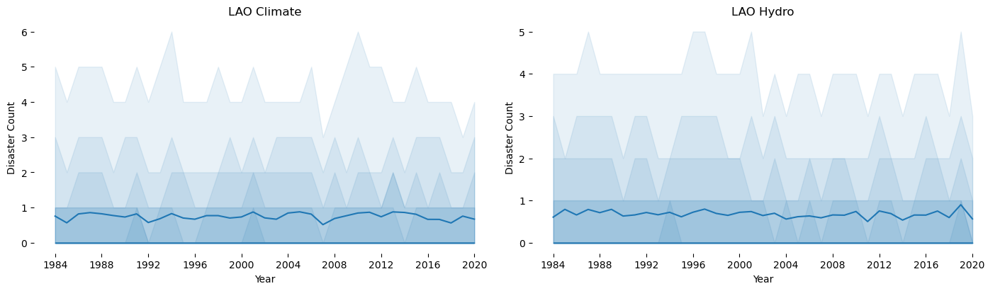

In [23]:
plot_predictions(prior, 'LAO', 'prior');

In [24]:
with model1:
    idata = sample_or_load(fp='idata/model_1_w_missing.nc',
                           sample_kwargs=dict(
                               init='jitter+adapt_diag_grad', 
                               cores=8,
                               chains=8, 
                               draws=250,
                               tune=250,
                               compile_kwargs={'mode':'NUMBA'}),
                           force_resample=False,
                           save_results=True,
                           compile_kwargs={'mode':'NUMBA'}
                          )
    idata = idata.assign_coords(idx)
    results['model1'] = idata

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>NUTS: [year_loc, year_scale, year_offset, country_loc, country_scale, country_offset, zero_prob, alpha]
>Metropolis: [y_hat_unobserved]


Output()

Sampling 8 chains for 250 tune and 250 draw iterations (2_000 + 2_000 draws total) took 605 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [y_hat_observed]


Output()

Output()

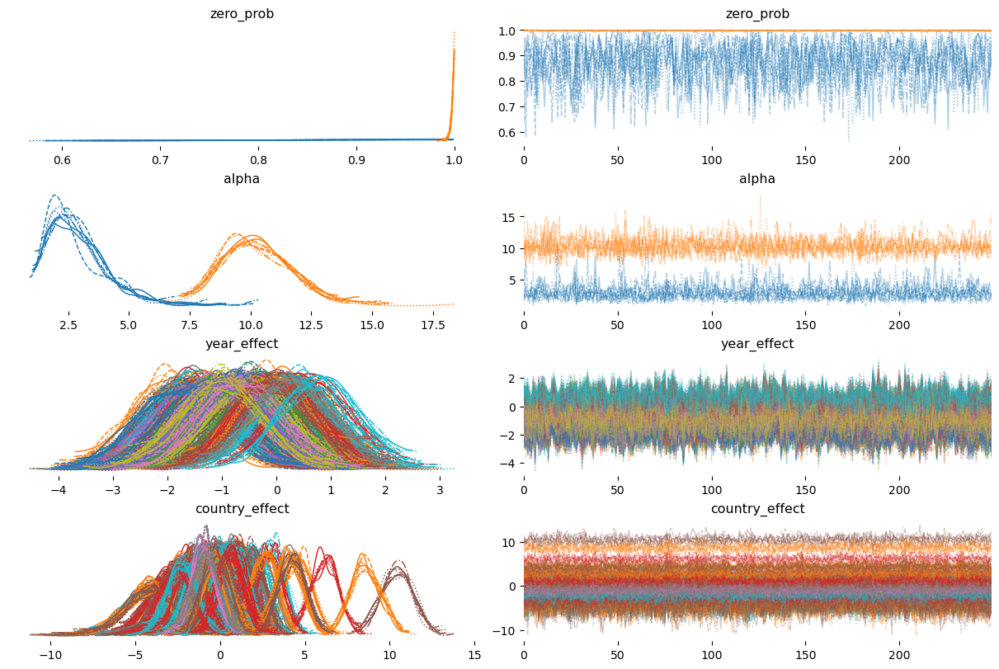

In [25]:
az.plot_trace(idata, var_names=['zero_prob', 'alpha', 'year_effect', 'country_effect']);

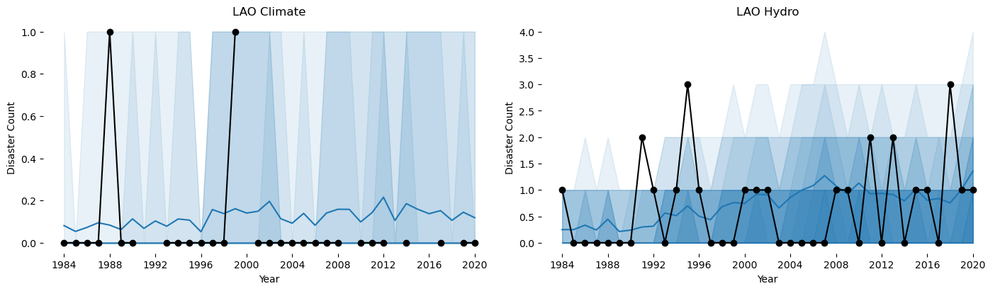

In [26]:
plot_predictions(idata, 
                 iso='LAO', 
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1))

# Covariates Only

In [27]:
features = ["ln_population_density", 
            "ln_gdp_pc", 
            "square_ln_gdp_p", 
            "precip_deviation", 
            "co2", 
            "population"]

sigma = 2.5 * df[disasters].std().values[:, None] / df[features].std().values[None]

In [28]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0]),
    'feature':features
}

with pm.Model(coords=coords) as model2:
    X = pm.Data('X', df[features], dims=['obs_idx', 'feature'])
    
    intercept = pm.Normal('intercept', sigma=10)
    
    beta = pm.Normal('beta', 0, sigma.T, dims=['feature', 'disaster'])
    coef_effect = X @ beta
    
    latent_rate = intercept + coef_effect    
    mu = pt.softplus(latent_rate)
    
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=pt.clip(mu, 1e-6, 300),
                                            alpha=alpha,
#                                             observed=df[disasters],
                                            observed=y,
                                            dims=['obs_idx', 'disaster'])
    
    prior = pm.sample_prior_predictive().assign_coords(idx)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1288: RuntimeWarning: invalid value encountered in cast
  data = convert_observed_data(data).astype(rv_var.dtype)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1302: ImputationWarning: Data in y_hat contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, beta, intercept, y_hat_observed, y_hat_unobserved, zero_prob]


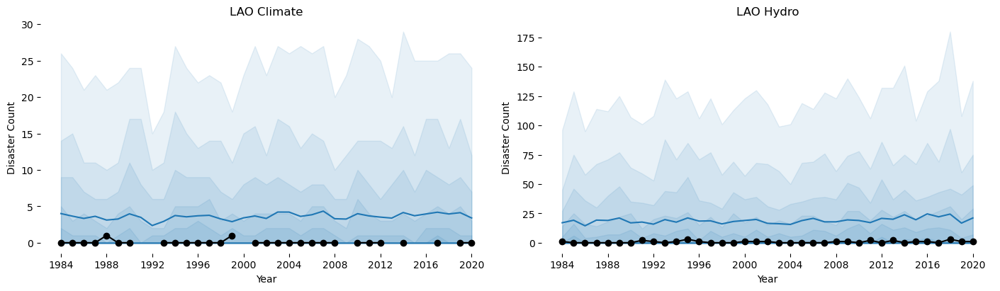

In [38]:
plot_predictions(prior, 'LAO', 'prior',
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1));

In [30]:
with model2:
    idata = sample_or_load(fp='idata/model_2_w_missing.nc',
                           sample_kwargs=dict(
#                                nuts_sampler='nutpie', 
                               init='jitter+adapt_diag_grad',
                               cores=8,
                               chains=8, 
                               draws=250,
                               tune=500,
                               compile_kwargs={'mode':'NUMBA'}
#                                nuts_sampler_kwargs={'backend':'jax'}
                               ),
                           force_resample=False,
                           save_results=True,
                           compile_kwargs={'mode':'NUMBA'},
                          )
    idata = idata.assign_coords(idx)
    results['model2'] = idata

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>NUTS: [intercept, beta, zero_prob, alpha]
>Metropolis: [y_hat_unobserved]


Output()

Sampling 8 chains for 500 tune and 250 draw iterations (4_000 + 2_000 draws total) took 1058 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [y_hat_observed]


Output()

Output()

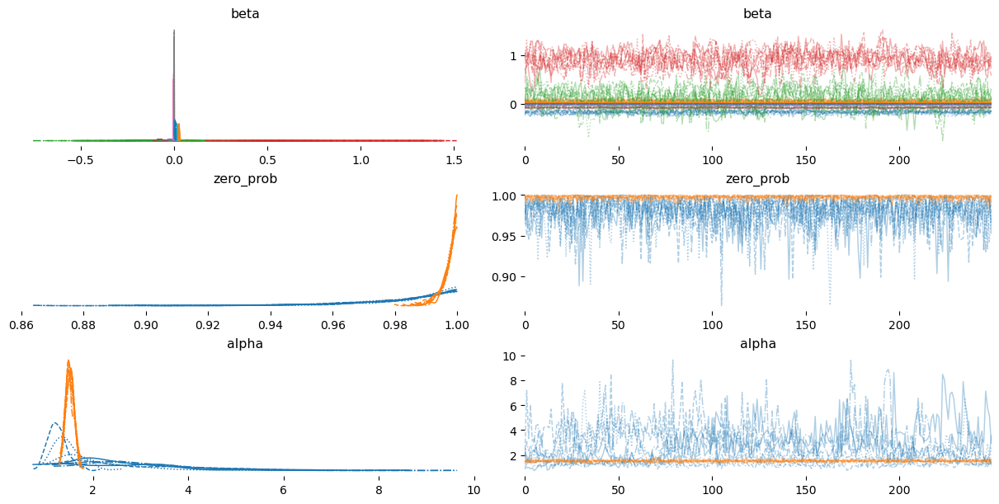

In [35]:
az.plot_trace(idata, var_names=['alpha', 'beta', 'zero_prob'], filter_vars='like');

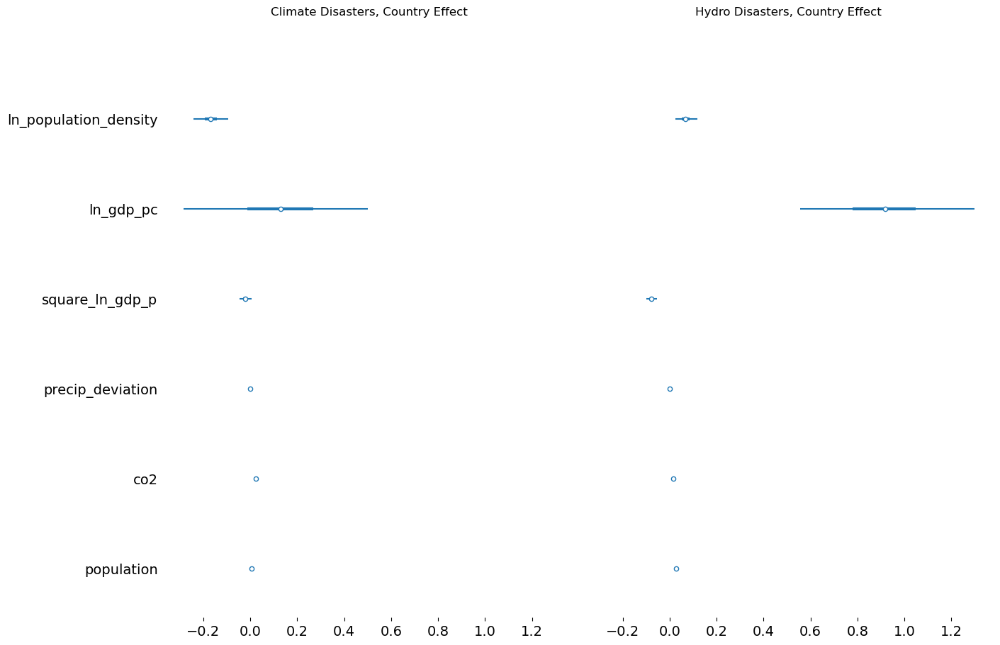

In [33]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['beta'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

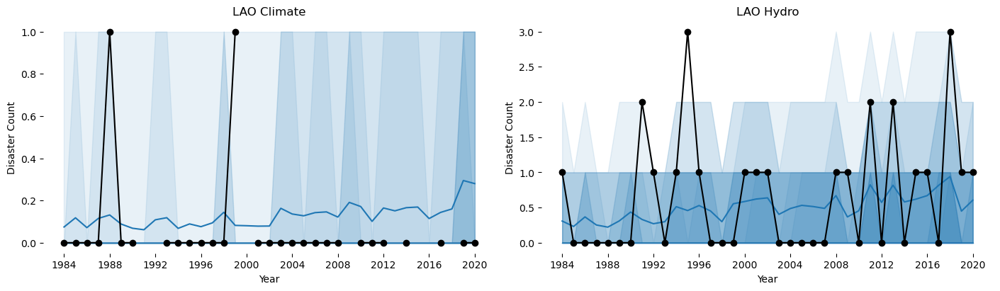

In [37]:
plot_predictions(idata, 
                 iso='LAO', 
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1))

## Time FE vs CO2

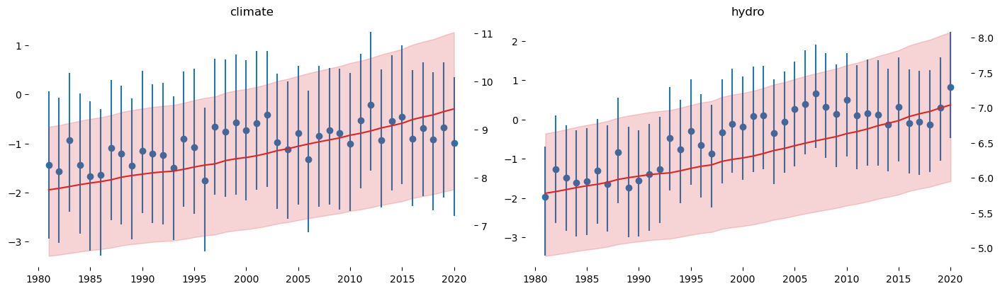

In [39]:
fig, ax = plt.subplots(1, 2)
time_effect = results['model1'].posterior.year_effect
time_mu = time_effect.mean(dim=['chain', 'draw'])
time_hdi = az.hdi(time_effect).year_effect

co2_beta = results['model2'].posterior.beta.sel(feature='co2')
co2_data = co2_beta * df['co2'].unstack('iso')['USA'].to_xarray() #.transform(lambda x: (x - x.mean()) / x.std())

co2_mu = co2_data.mean(dim=['chain', 'draw'])
co2_hdi = az.hdi(co2_data).x

for axis, disaster in zip(fig.axes, coords['disaster']):
    axis.scatter(years, time_mu.sel(disaster=disaster))
    axis.vlines(years, *time_hdi.sel(disaster=disaster).values.T)
    axis.set(title=disaster)
    
    axis2 = axis.twinx()
    axis2.plot(years, co2_mu.sel(disaster=disaster), color='tab:red')    
    axis2.fill_between(years, *co2_hdi.sel(disaster=disaster).values.T, color='tab:red', alpha=0.2)    

    

# Panel + Covariates

In [40]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

features = ["ln_population_density", 
               "ln_gdp_pc", 
               "square_ln_gdp_p", 
               "precip_deviation", 
               "co2", 
               "population"]

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0]),
    'feature':features,
    'latent': ['iso', 'year']
}



with pm.Model(coords=coords) as model3:
    X = pm.Data('X', df[features])
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])

    # Mundlak Adjustment
    latent_iso = pm.Normal('latent_iso', 1, dims=['iso', 'feature'])
    
    alpha_X = pm.Normal('alpha_X', 0, 1, dims=['feature'])
    sigma_X = pm.Exponential('sigma_X', 1, dims=['feature'])
    
    mu_X = alpha_X + latent_iso[iso_idx_pt]
    pm.Normal('X_hat', mu=mu_X, sigma=sigma_X, observed=X)
    
    # Actual Model    
    # Drop year FE; it's the same as the co2 effect
    country_loc = pm.Normal('country_loc', 0, 1, dims=['disaster'])
    country_scale = pm.Gamma('country_scale', alpha=2, beta=1, dims=['disaster'])
    country_offset = pm.ZeroSumNormal('country_offset', 1, dims=['iso', 'disaster'])

    country_effect = pm.Deterministic('country_effect',
                                      country_loc[None] + country_scale[None] * country_offset, 
                                      dims=['iso', 'disaster'])
    
    
    beta_sigma = 2.5 / df[features].std().values[None] * df[disasters].std().values[:, None]
    beta = pm.Normal('beta', 0, beta_sigma.T, dims=['feature', 'disaster'])
    beta_GY = pm.Normal('beta_GY', 0, 1, dims=['feature', 'disaster'])    
    coef_effect = X @ beta + (latent_iso @ beta_GY)[iso_idx_pt]
    
    latent_rate = country_effect[iso_idx_pt] + coef_effect
    
    mu = pt.softplus(latent_rate)
    
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=pt.clip(mu, 1e-6, 300),
                                            alpha=alpha,
#                                             observed=df[disasters],
                                            observed=y,
                                            dims=['obs_idx', 'disaster'])
    
    prior = pm.sample_prior_predictive().assign_coords(idx)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1288: RuntimeWarning: invalid value encountered in cast
  data = convert_observed_data(data).astype(rv_var.dtype)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1302: ImputationWarning: Data in y_hat contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [X_hat, alpha, alpha_X, beta, beta_GY, country_loc, country_offset, country_scale, latent_iso, sigma_X, y_hat_observed, y_hat_unobserved, zero_prob]


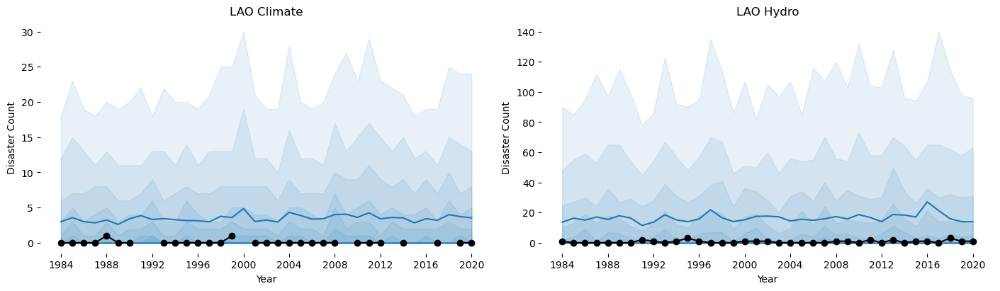

In [41]:
plot_predictions(prior, 'LAO', 'prior',
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1));

In [42]:
with model3:
    idata = sample_or_load(fp='idata/model_3_w_missing.nc',
                           sample_kwargs=dict(
#                                nuts_sampler='nutpie', 
                               init='jitter+adapt_diag_grad',
                               cores=8,
                               chains=8, 
                               draws=250,
                               tune=500,
#                                nuts_sampler_kwargs={'backend':'jax'}
                               compile_kwargs={'mode':'NUMBA'}
                               ),
                           force_resample=False,
                           save_results=True,
                           compile_kwargs={'mode':'NUMBA'},
                          )
    idata = idata.assign_coords(idx)
    results['model3'] = idata

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>NUTS: [latent_iso, alpha_X, sigma_X, country_loc, country_scale, country_offset, beta, beta_GY, zero_prob, alpha]
>Metropolis: [y_hat_unobserved]


Output()

Sampling 8 chains for 500 tune and 250 draw iterations (4_000 + 2_000 draws total) took 1621 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
Sampling: [X_hat, y_hat_observed]


Output()

Output()

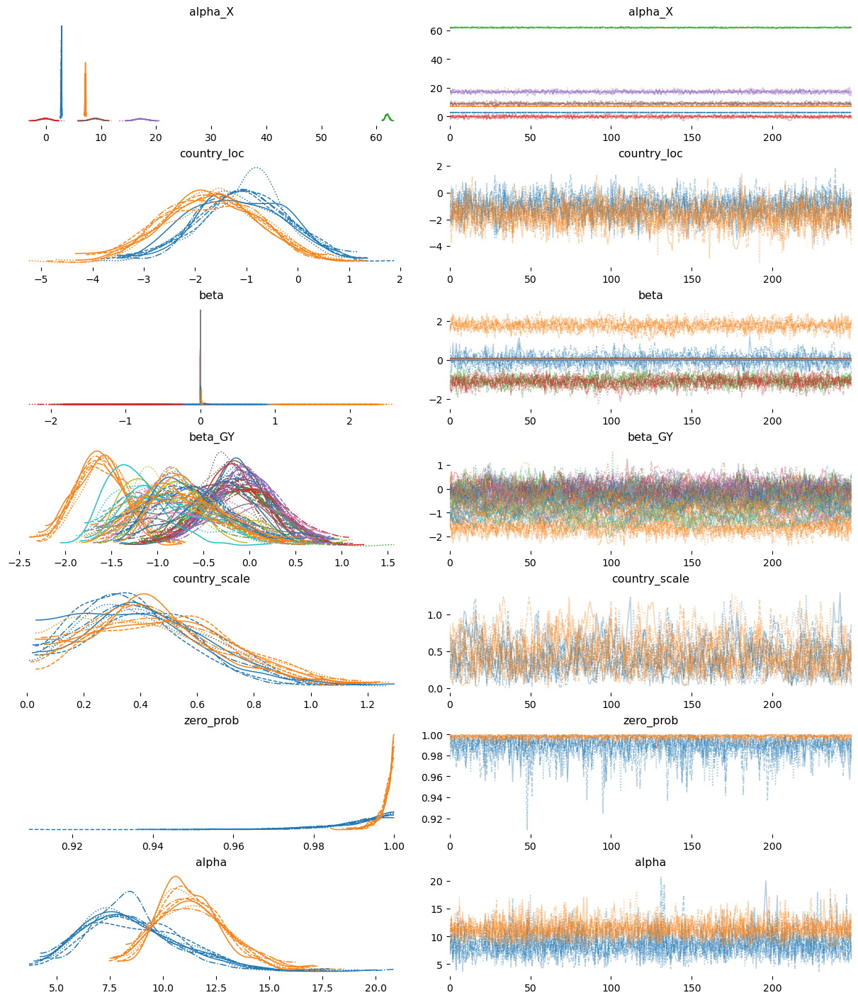

In [43]:
az.plot_trace(idata, 
              var_names=['country_loc', 'country_scale', 'alpha', 'beta', 'zero_prob', 'latent_loc'], 
              filter_vars='regex');

In [44]:
summary = az.summary(idata)
summary.sort_values(by='r_hat', ascending=False).head(30)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / withi

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_X[ln_gdp_pc],7.162,0.063,7.054,7.286,0.011,0.008,35.0,105.0,1.20
alpha_X[ln_population_density],2.798,0.061,2.702,2.926,0.009,0.006,45.0,64.0,1.16
"latent_iso[AUT, ln_gdp_pc]",3.332,0.081,3.180,3.476,0.012,0.009,45.0,214.0,1.14
"latent_iso[RWA, ln_gdp_pc]",-1.047,0.080,-1.193,-0.893,0.011,0.008,50.0,256.0,1.13
"beta_GY[precip_deviation, climate]",-0.596,0.472,-1.407,0.262,0.076,0.054,41.0,45.0,1.13
"latent_iso[JOR, ln_gdp_pc]",1.110,0.083,0.964,1.269,0.012,0.009,46.0,168.0,1.13
"latent_iso[BWA, ln_gdp_pc]",1.276,0.082,1.125,1.435,0.012,0.008,50.0,208.0,1.13
"latent_iso[CHE, ln_gdp_pc]",4.028,0.081,3.885,4.189,0.011,0.008,54.0,156.0,1.12
"latent_iso[CHL, ln_gdp_pc]",1.842,0.082,1.691,1.995,0.011,0.008,54.0,178.0,1.12
"latent_iso[GNB, ln_gdp_pc]",-0.786,0.082,-0.931,-0.629,0.011,0.008,54.0,147.0,1.12


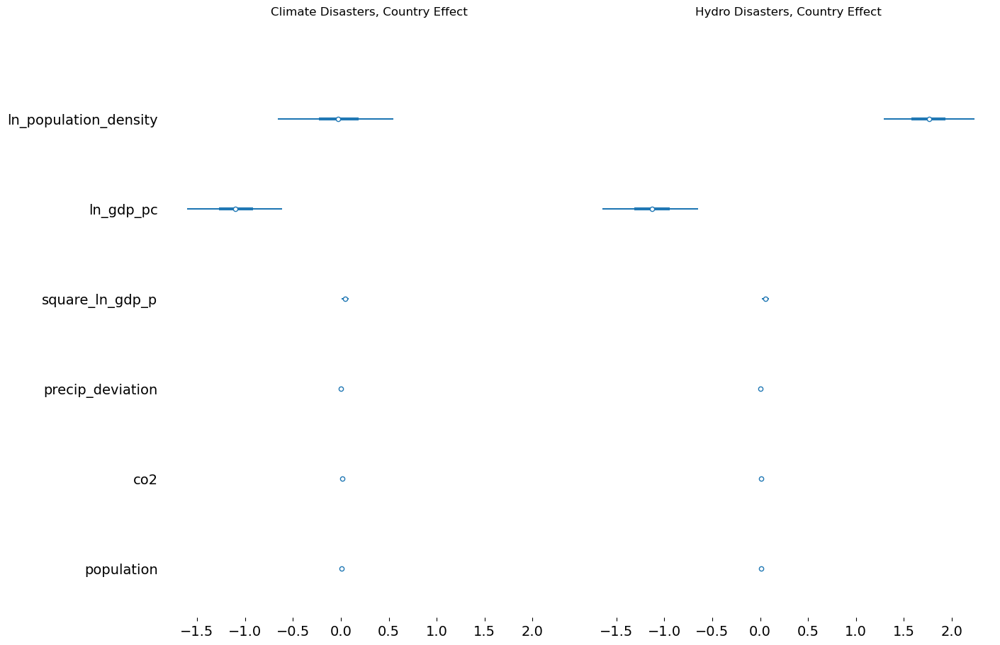

In [45]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['beta'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

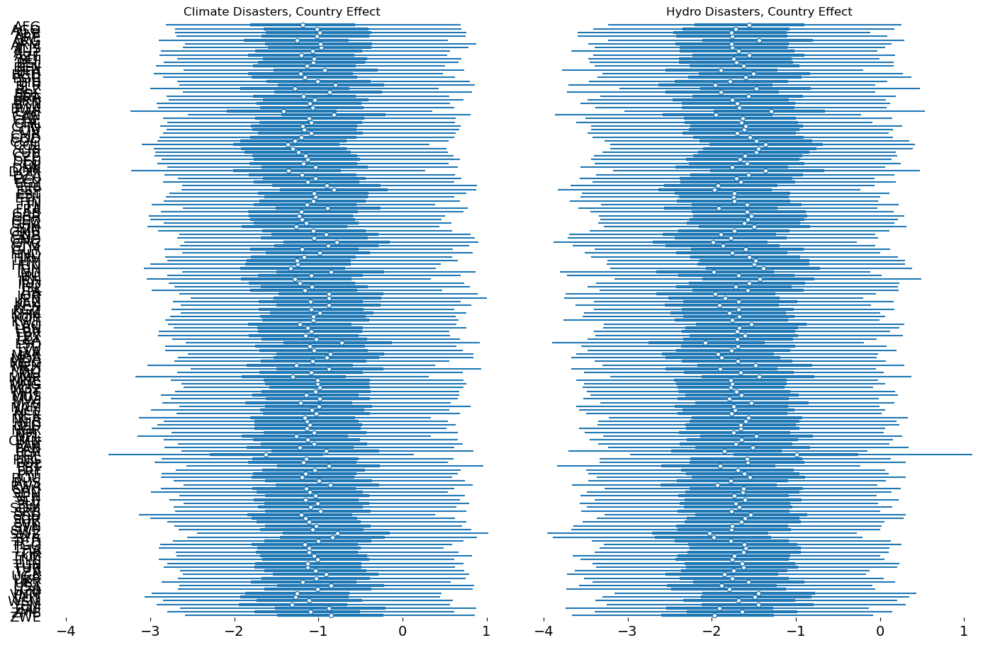

In [46]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['country_effect'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

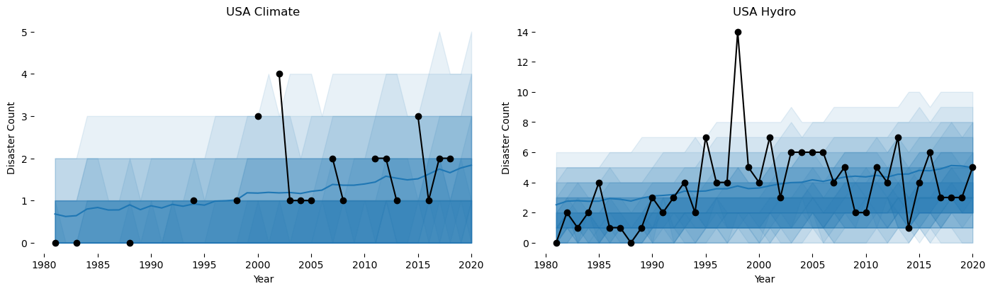

In [50]:
plot_predictions(idata, 
                 iso='USA', 
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1))

In [52]:
az.compare(results, var_name='y_hat_observed')

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model3,0,-6393.916801,198.509894,0.000000,0.986492,90.196844,0.000000,False,log
model1,1,-6813.600344,194.331795,419.683543,0.011895,94.961572,31.222888,True,log
model2,2,-7547.332859,26.991185,1153.416059,0.001614,105.616911,47.481726,False,log
model0,3,-7634.935857,164.094509,1241.019056,0.000000,111.665860,56.018874,False,log


# ICAR Mixin

## Nodes and adjacency matrix

In [53]:
with warnings.catch_warnings(action='ignore'):
    # Make graph of bordering countires
    w1 = fuzzy_contiguity(world)
    
    # Robustness of statistics to choice of k?
    w2 = KNN.from_dataframe(world, k=3)
    w = w_union(w1, w2)
    keys = sorted(list(w.neighbors.keys()))
    
    G = w.to_networkx().to_undirected()
    
    # Discard all but the main connected component (largest connected subgraph)
    G = nx.subgraph(G, list(nx.connected_components(G))[0])
    
    # Make a dataset of only the regions in the resulting graph
    connected_world = world.iloc[list(G.nodes)].copy()
    idx_to_name = dict(enumerate(keys))
    
    # Change node names from numbers to ISO codes and do a sanity check
    G = nx.relabel_nodes(G, idx_to_name)
    #assert list(G['USA'].keys()) == ['CAN', 'MEX']
    
    
    # Compute the weight matrix resulting from the graph and do a sanity check
    w = W.from_networkx(G)
    w.remap_ids(list(G.nodes))
    #assert w.neighbors['USA'] == ['CAN', 'MEX']

In [54]:
iso_mean = (idata.posterior_predictive
                .y_hat
                .mean(dim=['chain', 'draw'])
                .groupby('obs_iso')
                .mean()
                .to_dataframe()
                .loc[:, 'y_hat']
                .unstack('disaster'))

d = iso_mean.to_dict()

In [55]:
iso_mean.describe()

disaster,climate,hydro
count,159.000000,159.000000
mean,0.151721,0.766118
std,0.225117,1.313641
min,0.003563,0.013663
25%,0.025426,0.146919
50%,0.076688,0.388086
75%,0.178237,0.851888
max,1.463325,10.607288


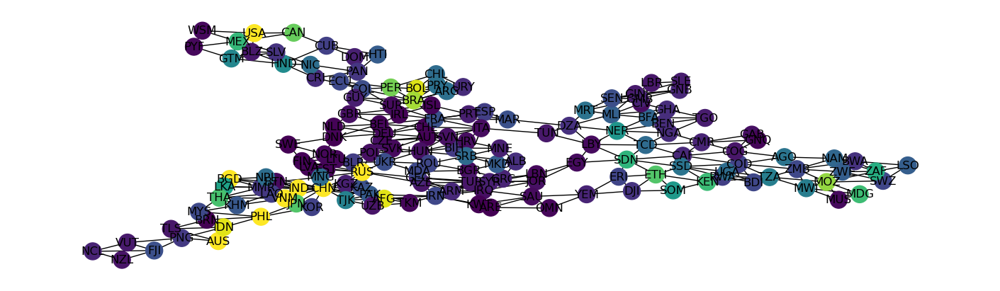

In [56]:
from networkx.drawing.nx_pydot import graphviz_layout
pos = graphviz_layout(G, prog='neato')
nx.draw_networkx(G, pos=pos, node_color=[d['climate'].get(n) for n in G.nodes], vmax=0.5)

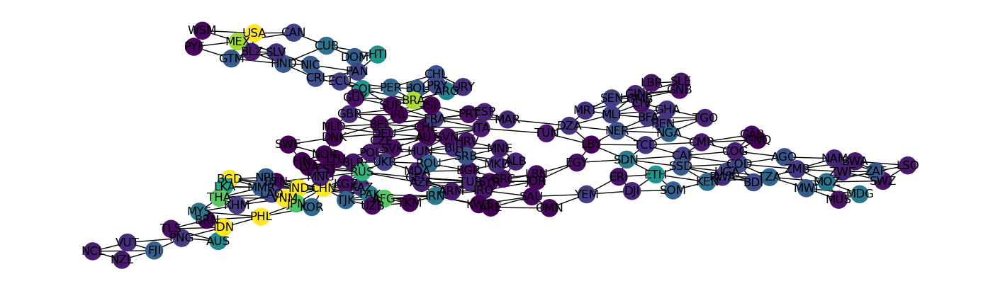

In [57]:
from networkx.drawing.nx_pydot import graphviz_layout
pos = graphviz_layout(G, prog='neato')
nx.draw_networkx(G, pos=pos, node_color=[d['hydro'].get(n) for n in G.nodes], vmax=3)

In [58]:
#Scaling factor function
def scaling_factor_sp(A):
    """Compute the scaling factor from an adjacency matrix.
    This function uses sparse matrix computations and is most
    efficient on sparse adjacency matrices. Used in the BYM2 model.
    The scaling factor is a measure of the variance in the number of
    edges across nodes in a connected graph.
    Only works for fully connected graphs. The argument for scaling
    factors is developed by Andrea Riebler, Sigrunn H. Sørbye,
    Daniel Simpson, Havard Rue in "An intuitive Bayesian spatial
    model for disease mapping that accounts for scaling"
    https://arxiv.org/abs/1601.01180"""

    # Computes the precision matrix in sparse format
    # from an adjacency matrix.

    num_neighbors = A.sum(axis=1)
    A = sparse.csc_matrix(A)
    D = sparse.diags(num_neighbors, format="csc")
    Q = D - A

    # add a small jitter along the diagonal

    Q_perturbed = Q + sparse.diags(np.ones(Q.shape[0])) * max(Q.diagonal()) * np.sqrt(
        np.finfo(np.float64).eps
    )

    # Compute a version of the pseudo-inverse

    n = Q_perturbed.shape[0]
    b = sparse.identity(n, format="csc")
    Sigma = spsolve(Q_perturbed, b)
    A = np.ones(n)
    W = Sigma @ A.T
    Q_inv = Sigma - np.outer(W * solve(A @ W, np.ones(1)), W.T)

    # Compute the geometric mean of the diagonal on a
    # precision matrix.

    return np.exp(np.sum(np.log(np.diag(Q_inv))) / n)

In [59]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

features = ["ln_population_density", 
               "ln_gdp_pc", 
               "square_ln_gdp_p", 
               "precip_deviation", 
               "co2", 
               "population"]

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0]),
    'feature':features,
    'latent': ['iso', 'year']
}


with pm.Model(coords=coords) as model4:
    X = pm.Data('X', df[features])
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])

    # Mundlak Adjustment
    latent_iso = pm.Normal('latent_iso', 1, dims=['iso', 'feature'])
    
    alpha_X = pm.Normal('alpha_X', 0, 1, dims=['feature'])
    sigma_X = pm.Exponential('sigma_X', 1, dims=['feature'])
    
    mu_X = alpha_X + latent_iso[iso_idx_pt]
    pm.Normal('X_hat', mu=mu_X, sigma=sigma_X, observed=X)
    
    # Actual Model    
    country_loc = pm.Normal('country_loc', 0, 1, dims=['disaster'])
    country_scale = pm.Gamma('country_scale', alpha=2, beta=1, dims=['disaster'])
    country_offset = pm.ZeroSumNormal('country_offset', 1, dims=['iso', 'disaster'])

    country_effect = pm.Deterministic('country_effect',
                                      country_loc[None] + country_scale[None] * country_offset, 
                                      dims=['iso', 'disaster'])
    
    
    beta_sigma = 2.5 / df[features].std().values[None] * df[disasters].std().values[:, None]
    beta = pm.Normal('beta', 0, beta_sigma.T, dims=['feature', 'disaster'])
    beta_GY = pm.Normal('beta_GY', 0, 1, dims=['feature', 'disaster'])    
    coef_effect = X @ beta + (latent_iso @ beta_GY)[iso_idx_pt]
    
    # ICAR Mixin
    A = nx.adjacency_matrix(G)
    theta = pm.Normal("theta", mu = 0, sigma = 1, dims = ["iso", 'disaster'])
    phi = [pm.ICAR(f"phi_{disaster}", W = A.todense(), dims = ["iso"]) for disaster in disasters]
    phi = pm.Deterministic('phi', pt.stack(phi).T, dims=['iso', 'disaster'])
    rho = pm.Beta("rho", 0.5, 0.5, dims=['disaster'])
    mixture = pm.Deterministic("mixture", pt.sqrt(1 - rho[None]) * theta + 
                               pt.sqrt(rho[None] / scaling_factor_sp(A)) *  phi, 
                               dims = ["iso", 'disaster'])

    latent_rate = (country_effect + mixture)[iso_idx_pt] + coef_effect
    mu = pt.softplus(latent_rate)
    
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=pt.clip(mu, 1e-6, 300),
                                            alpha=alpha,
#                                             observed=df[disasters],
                                            observed=y,
                                            dims=['obs_idx', 'disaster'])

# Can't prior predictive sample with ICAR priors
#     prior = pm.sample_prior_predictive().assign_coords(idx)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1288: RuntimeWarning: invalid value encountered in cast
  data = convert_observed_data(data).astype(rv_var.dtype)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc/model/core.py:1302: ImputationWarning: Data in y_hat contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [ ]:
with model4:
    idata = sample_or_load(fp='idata/model_4_w_missing.nc',
                           sample_kwargs=dict(
#                                nuts_sampler='nutpie', 
                               init='jitter+adapt_diag_grad',
                               cores=8,
                               chains=8, 
                               draws=250,
                               tune=500,
#                                nuts_sampler_kwargs={'backend':'jax'}
                               compile_kwargs={'mode':'NUMBA'}
                               ),
                           force_resample=False,
                           save_results=True,
                           compile_kwargs={'mode':'NUMBA'},
                          )
    idata = idata.assign_coords(idx)
    results['model4'] = idata

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/numba/dispatch/basic.py:372: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>NUTS: [latent_iso, alpha_X, sigma_X, country_loc, country_scale, country_offset, beta, beta_GY, theta, phi_climatological_disasters, phi_hydrological_disasters, rho, zero_prob, alpha]
>Metropolis: [y_hat_unobserved]


Output()

In [ ]:
plot_predictions(idata, 
                 iso='LAO', 
                 obs_name='y_hat_observed', 
                 data=y.set_axis(coords['disaster'], axis=1))

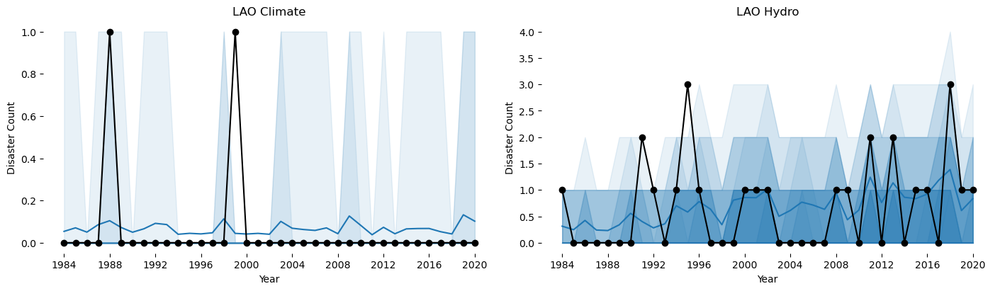

In [49]:
plot_predictions(idata, 'LAO');

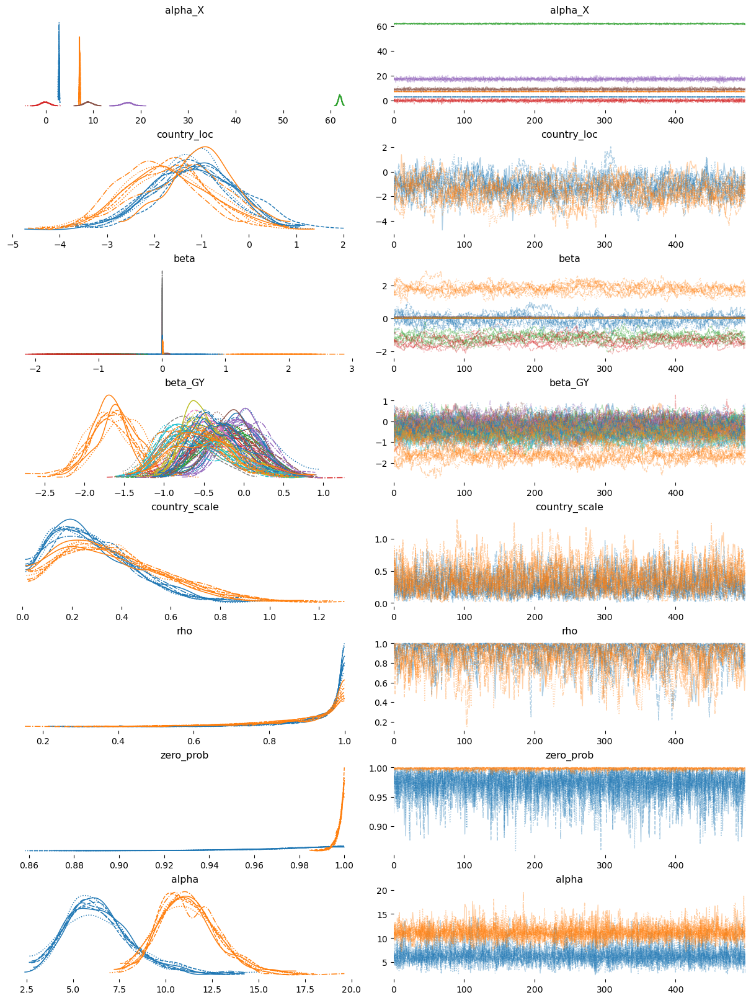

In [50]:
az.plot_trace(idata, 
              var_names=['country_loc', 'country_scale', 'alpha', 'beta', 'zero_prob', 'latent_loc', 'rho'], 
              filter_vars='regex');

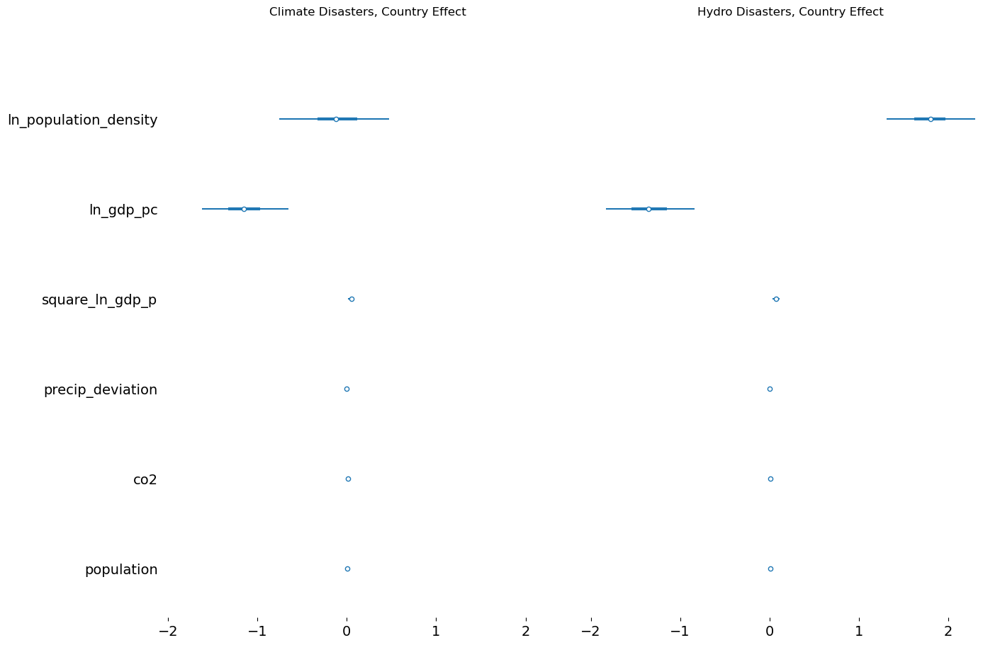

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['beta'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

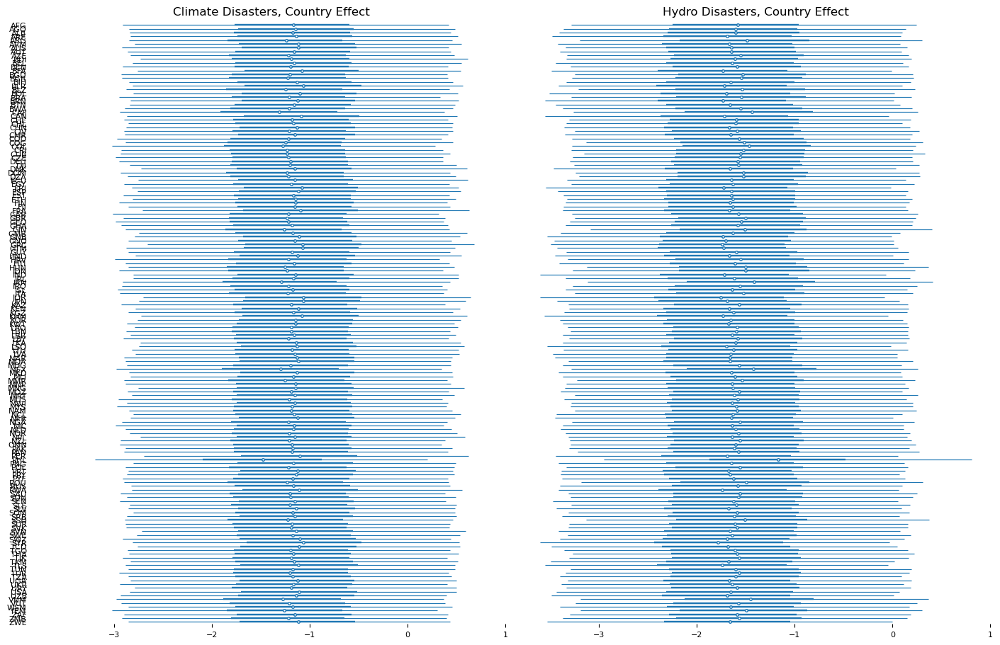

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['country_effect'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis,
                   textsize=8)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

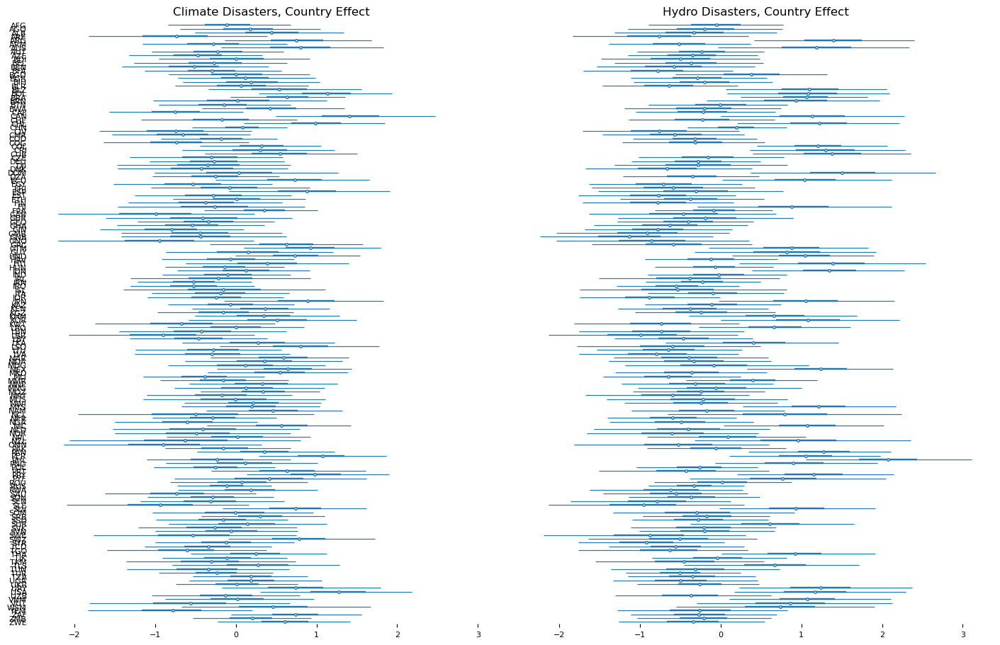

In [53]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['phi'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis,
                   textsize=8)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

In [54]:
az.compare(results, var_name='y_hat')

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model4,0,-6589.797043,212.198706,0.000000,0.540611,93.965657,0.000000,False,log
model3,1,-6590.223213,209.267210,0.426169,0.390239,93.904504,2.888946,False,log
model1,2,-6934.168728,194.324875,344.371685,0.066565,98.748821,30.182358,False,log
model2,3,-7685.077397,16.486334,1095.280354,0.002584,109.412166,47.603469,False,log
model0,4,-7716.995330,164.944304,1127.198287,0.000000,115.222820,54.724120,True,log


In [55]:
with pm.do(model4, {'rho':[1, 1]}):
    rho_1_post = pm.sample_posterior_predictive(idata, var_names=['mixture'])

Sampling: []


Output()

In [56]:
iso_mean = (rho_1_post.posterior_predictive
                .mixture
                .mean(dim=['chain', 'draw'])
                .to_dataframe()
                .loc[:, 'mixture']
                .unstack('disaster'))

d = iso_mean.to_dict()

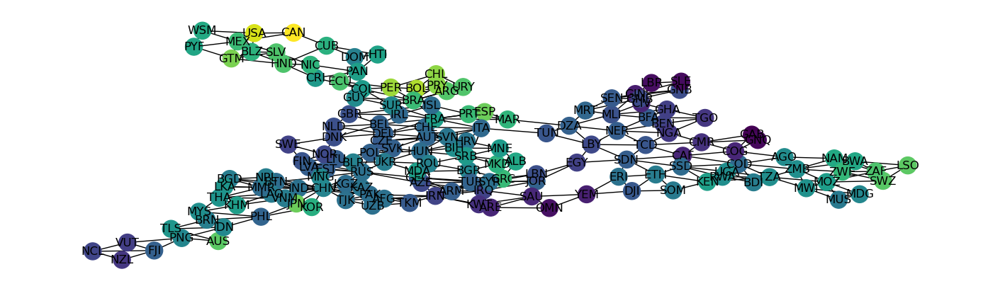

In [57]:
from networkx.drawing.nx_pydot import graphviz_layout
pos = graphviz_layout(G, prog='neato')
nx.draw_networkx(G, pos=pos, node_color=[d['climate'].get(n) for n in G.nodes])

In [58]:
world_pos = {iso: (v['x'], v['y']) for iso, v in (world.centroid
                 .apply(lambda x: pd.Series({'x':x.x, 'y':x.y}))
                 .T
                 .to_dict()).items()}

/var/folders/7b/rzxy96cj0w751_6td3g2yss00000gn/T/ipykernel_9227/569447385.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  world_pos = {iso: (v['x'], v['y']) for iso, v in (world.centroid


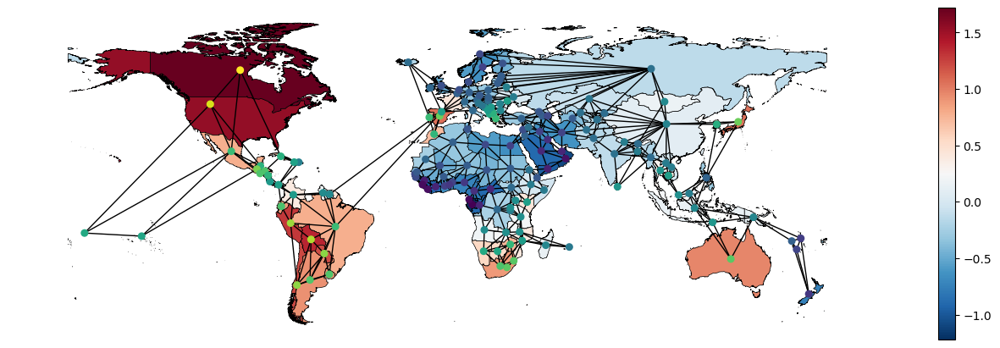

In [59]:
fig, ax = plt.subplots()
world.join(iso_mean).plot('climate', legend=True, cmap='RdBu_r', edgecolor='k', lw=0.5, ax=ax)
nx.draw_networkx(G, 
                 pos=world_pos, 
                 node_color=[d['climate'].get(n) for n in G.nodes], 
                 node_size=30,
                 with_labels=False)

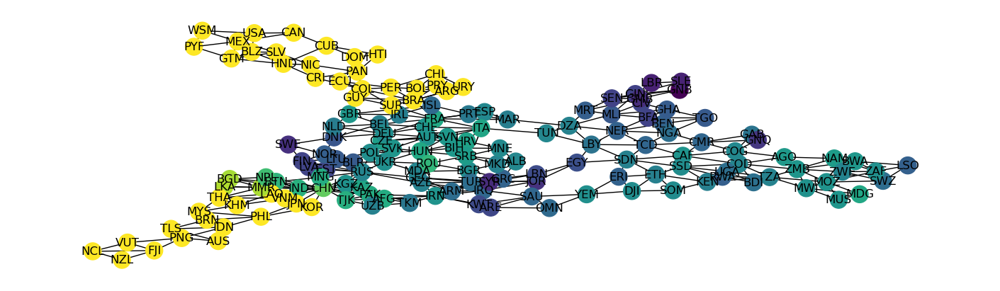

In [60]:
from networkx.drawing.nx_pydot import graphviz_layout
pos = graphviz_layout(G, prog='neato')
nx.draw_networkx(G, pos=pos, node_color=[d['hydro'].get(n) for n in G.nodes], vmax=0.75)

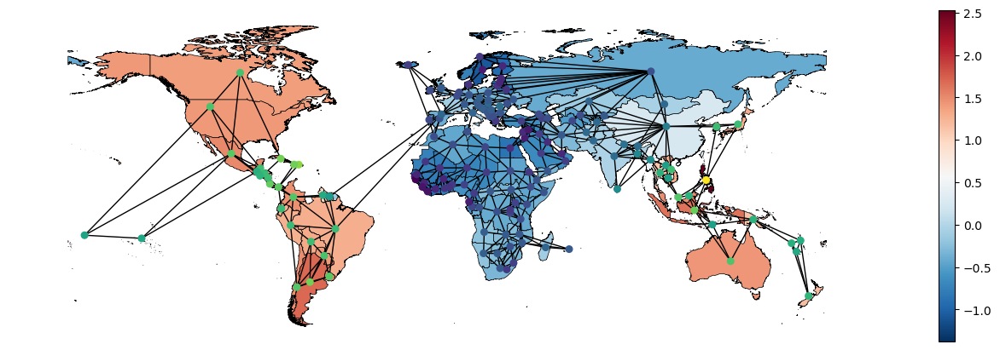

In [61]:
fig, ax = plt.subplots()
world.join(iso_mean).plot('hydro', legend=True, cmap='RdBu_r', edgecolor='k', lw=0.5, ax=ax)
nx.draw_networkx(G, 
                 pos=world_pos, 
                 node_color=[d['hydro'].get(n) for n in G.nodes], 
                 node_size=30,
                 with_labels=False,
                 ax=ax)

# Hierarchical Zero Prob

In [62]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

features = ["ln_population_density", 
               "ln_gdp_pc", 
               "square_ln_gdp_p", 
               "precip_deviation", 
               "co2", 
               "population"]

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0]),
    'feature':features,
    'latent': ['iso', 'year']
}


with pm.Model(coords=coords) as model5:
    X = pm.Data('X', df[features])
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])

    # Mundlak Adjustment
    latent_iso = pm.Normal('latent_iso', 1, dims=['iso', 'feature'])
    
    alpha_X = pm.Normal('alpha_X', 0, 1, dims=['feature'])
    sigma_X = pm.Exponential('sigma_X', 1, dims=['feature'])
    
    mu_X = alpha_X + latent_iso[iso_idx_pt]
    pm.Normal('X_hat', mu=mu_X, sigma=sigma_X, observed=X)
    
    # Actual Model    
    country_loc = pm.Normal('country_loc', 0, 1, dims=['disaster'])
    country_scale = pm.Gamma('country_scale', alpha=2, beta=1, dims=['disaster'])
    country_offset = pm.ZeroSumNormal('country_offset', 1, dims=['iso', 'disaster'])

    country_effect = pm.Deterministic('country_effect',
                                      country_loc[None] + country_scale[None] * country_offset, 
                                      dims=['iso', 'disaster'])
    
    
    beta_sigma = 2.5 / df[features].std().values[None] * df[disasters].std().values[:, None]
    beta = pm.Normal('beta', 0, beta_sigma.T, dims=['feature', 'disaster'])
    beta_GY = pm.Normal('beta_GY', 0, 1, dims=['feature', 'disaster'])    
    coef_effect = X @ beta + (latent_iso @ beta_GY)[iso_idx_pt]
    
    # ICAR Mixin
    A = nx.adjacency_matrix(G)
    theta = pm.Normal("theta", mu = 0, sigma = 1, dims = ["iso", 'disaster'])
    phi = [pm.ICAR(f"phi_{disaster}", W = A.todense(), dims = ["iso"]) for disaster in disasters]
    phi = pm.Deterministic('phi', pt.stack(phi).T, dims=['iso', 'disaster'])
    rho = pm.Beta("rho", 0.5, 0.5, dims=['disaster'])
    mixture = pm.Deterministic("mixture", pt.sqrt(1 - rho[None]) * theta + 
                               pt.sqrt(rho[None] / scaling_factor_sp(A)) *  phi, 
                               dims = ["iso", 'disaster'])

    latent_rate = (country_effect + mixture)[iso_idx_pt] + coef_effect
    
    mu = pt.softplus(latent_rate)
    
    zero_prob_loc = pm.Normal('zero_prob_loc', mu=0, sigma=1, dims=['disaster'])
    zero_prob_scale = pm.Gamma('zero_prob_scale', alpha=2, beta=1, dims=['disaster'])
    zero_prob_offset = pm.ZeroSumNormal('zero_prob_offset', sigma=1, dims=['iso', 'disaster'])
    zero_prob = pm.Deterministic('zero_prob', 
                                 pt.sigmoid(zero_prob_loc[None] + zero_prob_scale[None] * zero_prob_offset),
                                 dims=['iso', 'disaster'])
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob[iso_idx_pt],
                                            mu=pt.clip(mu, 1e-6, 300),
                                            alpha=alpha,
                                            observed=df[disasters],
                                            dims=['obs_idx', 'disaster'])

In [63]:
with model5:
    idata = sample_or_load(fp='idata/model_5.nc',
                           sample_kwargs=dict(
                               nuts_sampler='nutpie', 
                               cores=8,
                               chains=8, 
                               draws=500,
                               nuts_sampler_kwargs={'backend':'jax'}
                               ),
                           compile_kwargs={'mode':'NUMBA'},
                          )
    idata = idata.assign_coords(idx)
    results['model5'] = idata

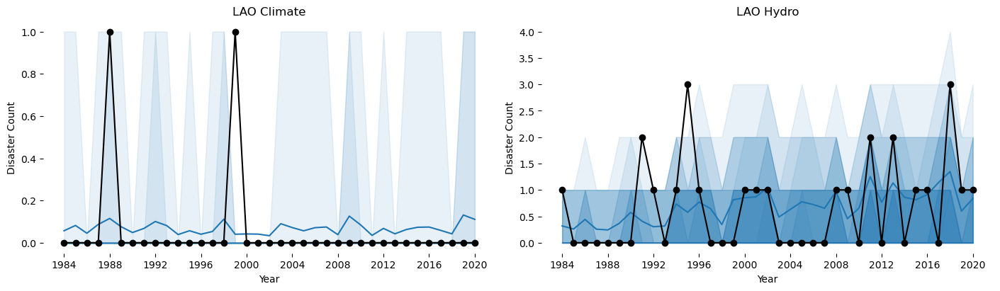

In [64]:
plot_predictions(idata, 'LAO');

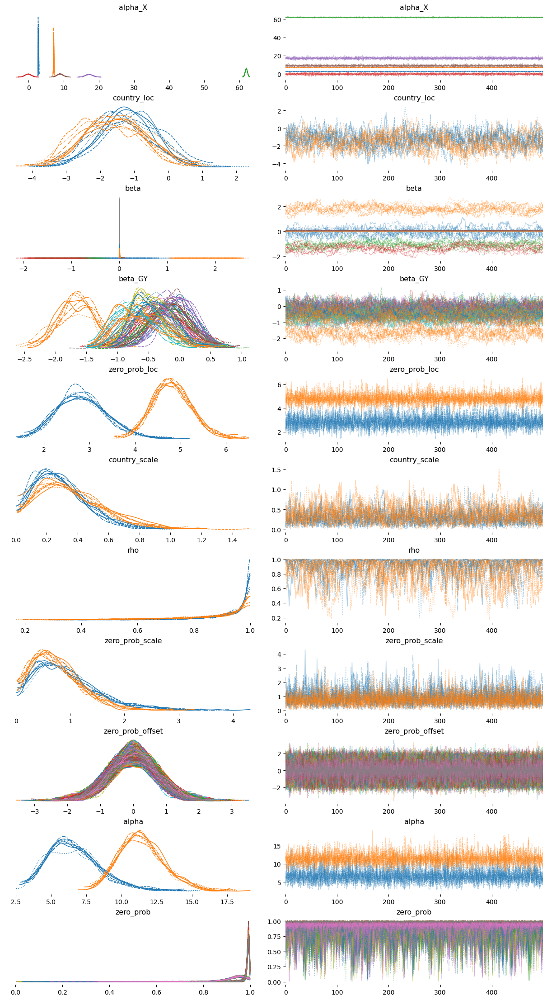

In [65]:
az.plot_trace(idata, 
              var_names=['country_loc', 'country_scale', 'alpha', 'beta', 'zero_prob', 'latent_loc', 'rho'], 
              filter_vars='regex');

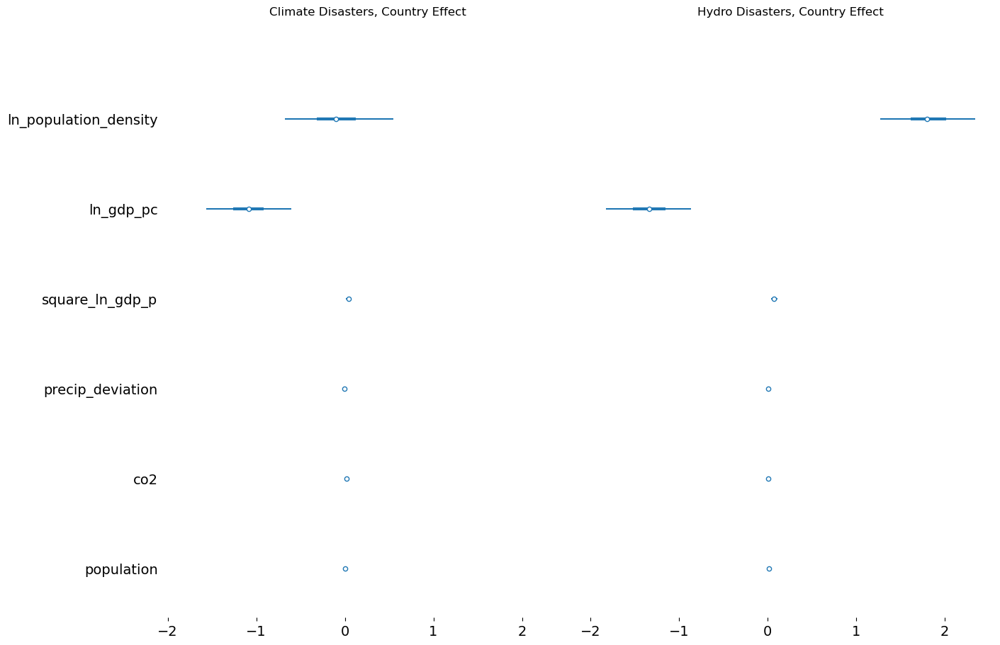

In [66]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['beta'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

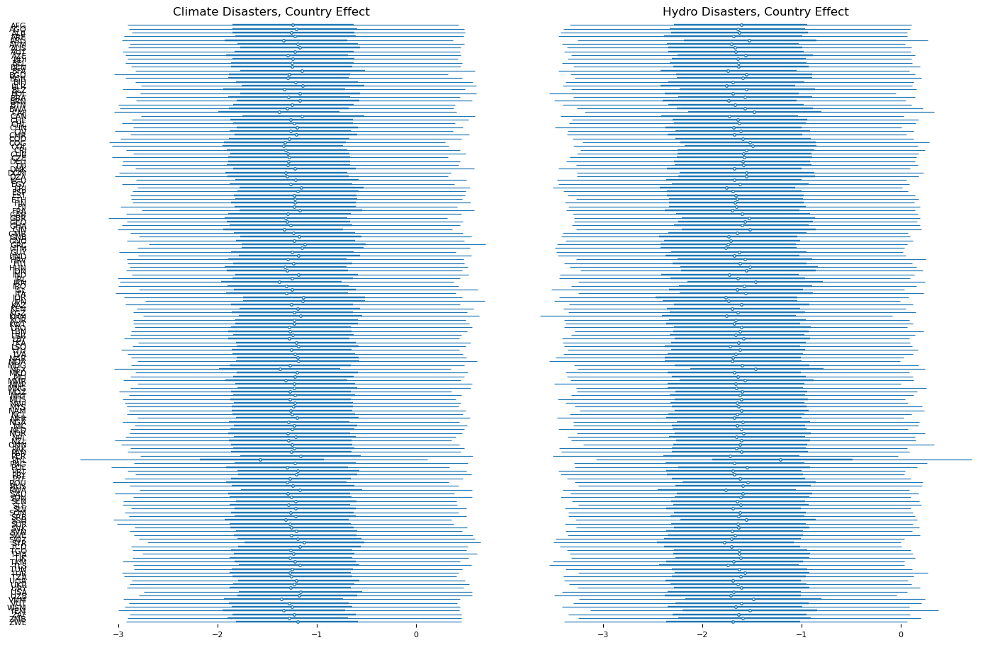

In [67]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['country_effect'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis,
                   textsize=8)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

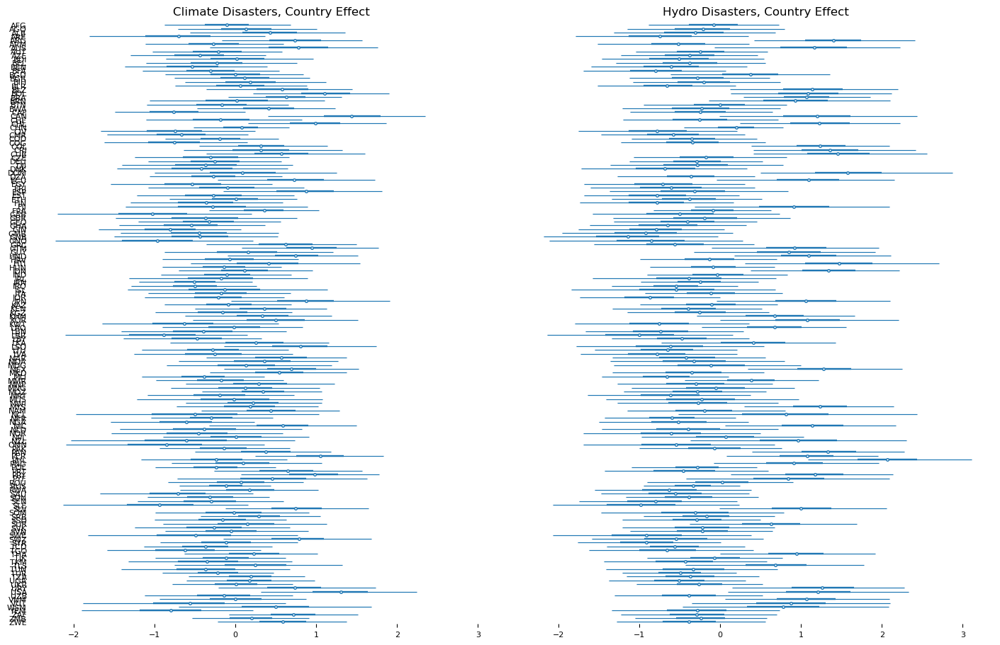

In [68]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['phi'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis,
                   textsize=8)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

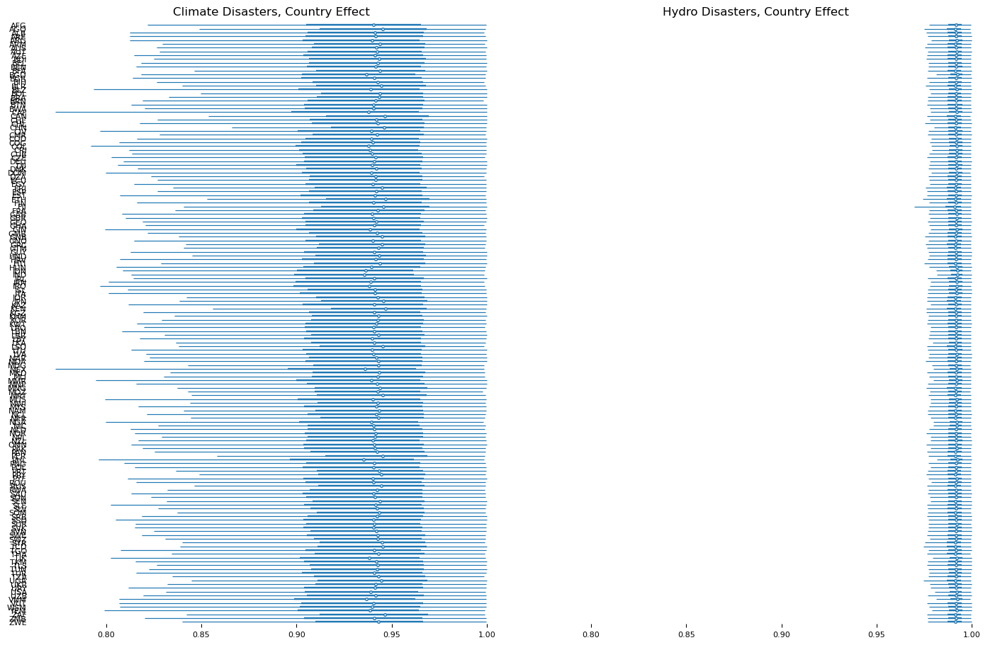

In [69]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['zero_prob'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis,
                   textsize=8)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

In [70]:
az.compare(results, var_name='y_hat')

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model4,0,-6589.797043,212.198706,0.000000,5.406564e-01,93.965657,0.000000,False,log
model3,1,-6590.223213,209.267210,0.426169,3.901886e-01,93.904504,2.888946,False,log
model5,2,-6595.641633,211.581391,5.844590,1.186673e-08,94.015582,0.801672,False,log
model1,3,-6934.168728,194.324875,344.371685,6.657243e-02,98.748821,30.182358,False,log
model2,4,-7685.077397,16.486334,1095.280354,2.582516e-03,109.412166,47.603469,False,log
model0,5,-7716.995330,164.944304,1127.198287,0.000000e+00,115.222820,54.724120,True,log


# No Country Effect

In [71]:
idx = xr.Coordinates.from_pandas_multiindex(df.index.rename({'iso':'obs_iso', 'year':'obs_year'}), 'obs_idx')

features = ["ln_population_density", 
               "ln_gdp_pc", 
               "square_ln_gdp_p", 
               "precip_deviation", 
               "co2", 
               "population"]

coords = {
    'iso':codes,
    'year': [dt.year for dt in years],
    'disaster': ['climate', 'hydro'],
    'obs_idx': np.arange(df.shape[0]),
    'feature':features,
    'latent': ['iso', 'year']
}


with pm.Model(coords=coords) as model6:
    X = pm.Data('X', df[features])
    iso_idx_pt = pm.Data('iso_idx', code_idx, dims=['obs_idx'])

    # Mundlak Adjustment
    latent_iso = pm.Normal('latent_iso', 1, dims=['iso', 'feature'])
    
    alpha_X = pm.Normal('alpha_X', 0, 1, dims=['feature'])
    sigma_X = pm.Exponential('sigma_X', 1, dims=['feature'])
    
    mu_X = alpha_X + latent_iso[iso_idx_pt] # + (latent_year * beta_GX[1])[year_idx_pt]
    pm.Normal('X_hat', mu=mu_X, sigma=sigma_X, observed=X)
        
    
    beta_sigma = 2.5 / df[features].std().values[None] * df[disasters].std().values[:, None]
    beta = pm.Normal('beta', 0, beta_sigma.T, dims=['feature', 'disaster'])
    beta_GY = pm.Normal('beta_GY', 0, 1, dims=['feature', 'disaster'])    
    coef_effect = X @ beta + (latent_iso @ beta_GY)[iso_idx_pt]
    
    # ICAR Mixin
    A = nx.adjacency_matrix(G)
    theta = pm.Normal("theta", mu = 0, sigma = 1, dims = ["iso", 'disaster'])
    phi = [pm.ICAR(f"phi_{disaster}", W = A.todense(), dims = ["iso"]) for disaster in disasters]
    phi = pm.Deterministic('phi', pt.stack(phi).T, dims=['iso', 'disaster'])
    rho = pm.Beta("rho", 0.5, 0.5, dims=['disaster'])
    mixture = pm.Deterministic("mixture", pt.sqrt(1 - rho[None]) * theta + 
                               pt.sqrt(rho[None] / scaling_factor_sp(A)) *  phi, 
                               dims = ["iso", 'disaster'])

    latent_rate = mixture[iso_idx_pt] + coef_effect
    
    mu = pt.softplus(latent_rate)
    
    zero_prob = pm.Beta('zero_prob', alpha=1, beta=1, dims=['disaster'])
    alpha = pm.Gamma('alpha', alpha=2, beta=1, dims=['disaster'])
    
    y_hat = pm.ZeroInflatedNegativeBinomial('y_hat',
                                            psi=zero_prob,
                                            mu=pt.clip(mu, 1e-6, 300),
                                            alpha=alpha,
                                            observed=df[disasters],
                                            dims=['obs_idx', 'disaster'])

In [72]:
with model6:
    idata = sample_or_load(fp='idata/model_6.nc',
                           sample_kwargs=dict(
                               nuts_sampler='nutpie', 
                               cores=8,
                               chains=8, 
                               draws=500,
                               nuts_sampler_kwargs={'backend':'jax'}
                               ),
                           compile_kwargs={'mode':'NUMBA'},
                          )
    idata = idata.assign_coords(idx)
    results['model6'] = idata

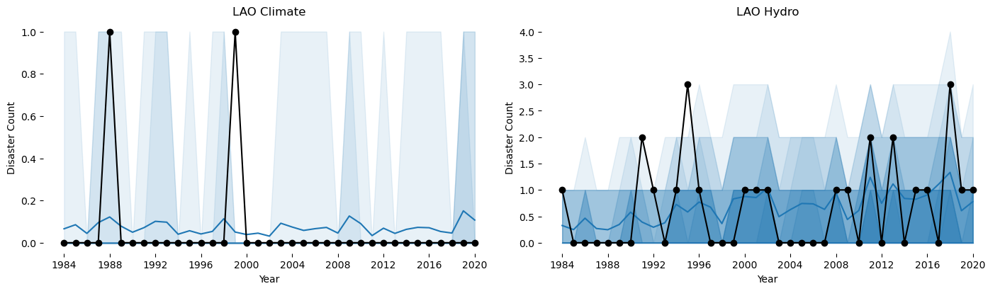

In [73]:
plot_predictions(idata, 'LAO');

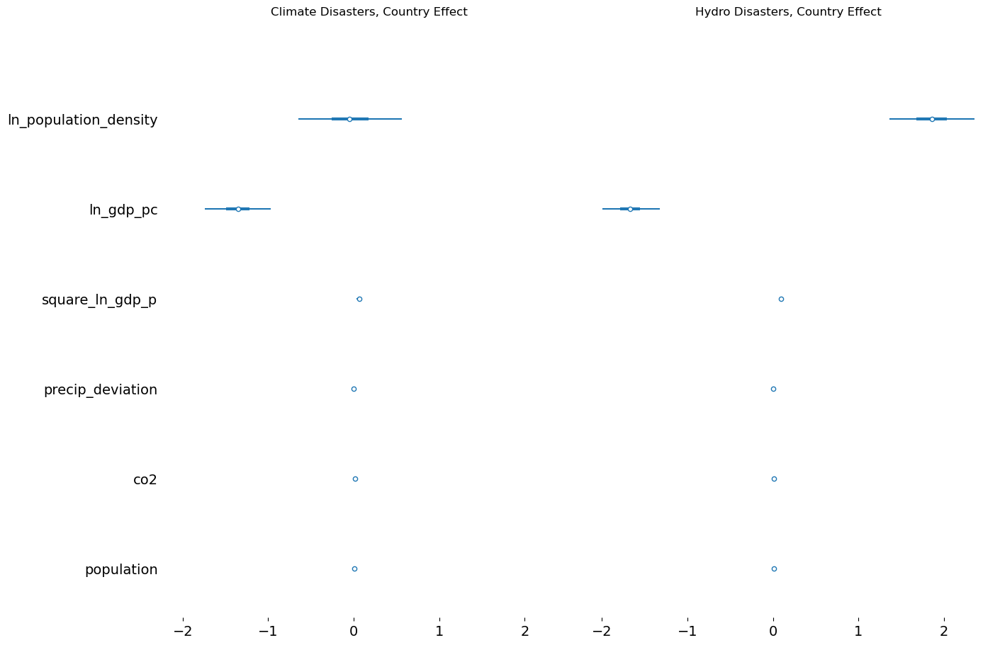

In [74]:
fig, ax = plt.subplots(1, 2, figsize=(14, 9), sharex=True, sharey=True)
for axis, disaster in zip(fig.axes, coords['disaster']):
    az.plot_forest(idata, var_names=['beta'], 
                   combined=True, 
                   labeller=az.labels.NoVarLabeller(),
                   coords={'disaster':[disaster]},
                   ax=axis)
    axis.set_title(disaster.title() + " Disasters, Country Effect")

In [75]:
az.compare(results, var_name='y_hat')

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model4,0,-6589.797043,212.198706,0.000000,5.406947e-01,93.965657,0.000000,False,log
model3,1,-6590.223213,209.267210,0.426169,3.901459e-01,93.904504,2.888946,False,log
model6,2,-6591.114606,208.551140,1.317563,3.440006e-09,93.918097,0.909186,False,log
model5,3,-6595.641633,211.581391,5.844590,3.390110e-09,94.015582,0.801672,False,log
model1,4,-6934.168728,194.324875,344.371685,6.657822e-02,98.748821,30.182358,False,log
model2,5,-7685.077397,16.486334,1095.280354,2.581182e-03,109.412166,47.603469,False,log
model0,6,-7716.995330,164.944304,1127.198287,0.000000e+00,115.222820,54.724120,True,log


# Damage from Event Model

In [97]:
mean_damage = ((df[['Total_Damage_Adjusted_hydro', 'Total_Damage_Adjusted_clim'] + disasters])
                   .fillna(0)
                   .replace({np.inf: 0.0, -np.inf:0.0}))

In [98]:
mean_damage.unstack('iso').xs(axis=1, level=1, key='LAO')

,Total_Damage_Adjusted_hydro,Total_Damage_Adjusted_clim,climatological_disasters,hydrological_disasters
year,,,,
1981-01-01,NaN,NaN,NaN,NaN
1982-01-01,NaN,NaN,NaN,NaN
1983-01-01,NaN,NaN,NaN,NaN
1984-01-01,0.0,0.0,0.0,1.0
1985-01-01,0.0,0.0,0.0,0.0
1986-01-01,0.0,0.0,0.0,0.0
1987-01-01,0.0,0.0,0.0,0.0
1988-01-01,0.0,0.0,1.0,0.0
1989-01-01,0.0,0.0,0.0,0.0


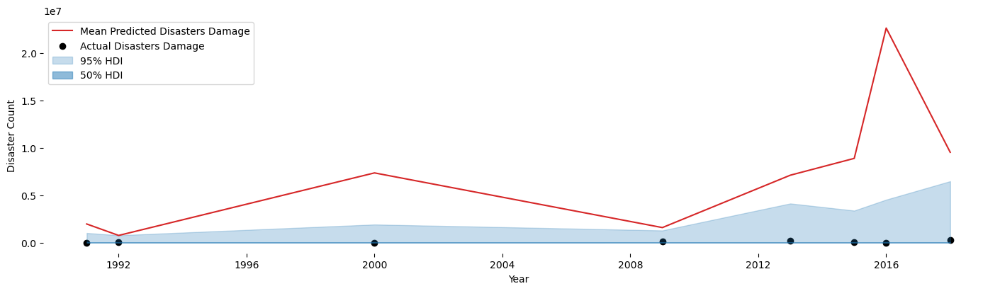

In [44]:
plotting_function(idata = version_0_model_HydroMeteorological_idata,
                  disaster_type = "hydrometereological",
                  country= "LAO")

# version_0_model_Climatological: no dev_from_trend_ocean_temp

## Reconcile EMDAT and shapefile ISO codes

In [45]:
#Load shapefiles
world = load_shapefile('world', repair_ISO_codes=True)
world.set_index('ISO_A3', inplace=True)

In [46]:
df_iso = df_climatological["ISO"].unique()
world_iso = world.index.unique()

In [47]:
# Codes in EMDAT but not in world
# These are all historical:
", ".join(list(set(df_iso) - set(world_iso)))

''

In [48]:
# Codes in shapefile but not in EMDAT
", ".join(list(set(world_iso) - set(df_iso)))

'ISR, QAT, MHL, COM, GUM, MNE, SLE, IMN, JOR, LUX, SLB, CUW, GIN, BMU, SPM, WLF, VCT, PRK, SYC, HKG, UNK, LVA, VAT, GAB, FRO, COK, GRL, MNP, LSO, TGO, SUR, PSE, BTN, MCO, CYP, SSD, SXM, TUV, KNA, GIB, FIN, FSM, GMB, ATF, CPV, KIR, DMA, VIR, SYR, KWT, NCL, SHN, MLI, PCN, NIU, GRD, GNQ, TKM, SGP, DNK, GNB, AND, BRB, SGS, BEL, HMD, LIE, MDV, CIV, IOT, ABW, CYM, LCA, MSR, TCA, FLK, TON, JEY, ASM, BHR, TTO, ISL, SMR, STP, MAC, VEN, PRI, BLM, AIA, EST, JAM, BRN, SWE, MAF, NRU, NFK, GGY, BHS, ATG, DJI, VGB, MLT, PLW, ARE'

In [49]:
# Drop codes not in both
common_codes = set(world_iso).intersection(set(df_iso))
df_climatological = df_climatological.set_index(["ISO", "year"]).loc[lambda x: x.index.get_level_values(0).isin(common_codes)].copy()

world = world.loc[world.index.isin(common_codes)].copy()

df_climatological = df_climatological.reset_index()

In [50]:
# Get unique iso codes and years
code_idx, codes = pd.factorize(df_climatological["ISO"], sort=True)
year_idx, years = pd.factorize(df_climatological["year"], sort=True)

disasters = ["climatological_disasters", "hydrological_disasters"]

## Nodes and adjacency matrix

In [51]:
with warnings.catch_warnings(action='ignore'):
    # Make graph of bordering countires
    w1 = fuzzy_contiguity(world)
    
    # Robustness of statistics to choice of k?
    w2 = KNN.from_dataframe(world, k=2)    
    w = w_union(w1, w2)
    keys = sorted(list(w.neighbors.keys()))
    
    G = w.to_networkx().to_undirected()
    
    # Discard all but the main connected component (largest connected subgraph)
    G = nx.subgraph(G, list(nx.connected_components(G))[0])
    
    # Make a dataset of only the regions in the resulting graph
    connected_world = world.iloc[list(G.nodes)].copy()
    idx_to_name = dict(enumerate(keys))
    
    # Change node names from numbers to ISO codes and do a sanity check
    G = nx.relabel_nodes(G, idx_to_name)
    #assert list(G['USA'].keys()) == ['CAN', 'MEX']
    
    
    # Compute the weight matrix resulting from the graph and do a sanity check
    w = W.from_networkx(G)
    w.remap_ids(list(G.nodes))
    #assert w.neighbors['USA'] == ['CAN', 'MEX']

In [52]:
# Adjusting the shapes of coords and data
not_in_connected_world = []

for country in (df_hydrometereological["ISO"].unique()):
    if country not in connected_world.index.values :
        not_in_connected_world.append(country)

In [53]:
df_climatological = df_climatological.set_index(['ISO'])
df_climatological = df_climatological.drop(not_in_connected_world)
df_climatological = df_climatological.reset_index()

In [54]:
#Creating the adjacency matrix
A = nx.adjacency_matrix(G)

In [55]:
# Compute node positions for network graph (spring layout)
pos = nx.drawing.nx_pydot.graphviz_layout(G, 'neato')

In [56]:
#Defining the scaling factor
scaling_factor = scaling_factor_sp(A)
scaling_factor

1.0025148703042845

In [57]:
def network_plotting(y_predict, G =G):
    fig, ax = plt.subplots(figsize=(12, 8), dpi=77)
    node_paths = nx.draw_networkx_nodes(
        G,
        pos=pos,
        node_color= y_predict.sel(year = "2018-01-01").to_numpy(),
        cmap="plasma",
        alpha=0.6,
        vmax=40,
        node_size=30 + 70 * np.log(y_predict.sel(year = "2018-01-01").to_numpy()),
    )
    node_edges = nx.draw_networkx_edges(G, pos=pos, width=0.5)
    fig.colorbar(node_paths, shrink=0.75, extend='max')
    ax.axis('off');
    # plt.show()

## Define features and coords

In [58]:
#Define features and normalize variables
features_0C = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "co2", "population"]

In [59]:
#Define features and normalize variables
df_climatological1 = df_climatological.drop(columns = "ISO")

df_climatological1_norm = (df_climatological1 -df_climatological1.mean())/ df_climatological1.std()

standard_deviations = df_climatological1.std()

C:\Users\camil\AppData\Local\Temp\ipykernel_46464\3687074068.py:4: PerformanceWarning: Adding/subtracting object-dtype array to DatetimeArray not vectorized.
  df_climatological1_norm = (df_climatological1 -df_climatological1.mean())/ df_climatological1.std()


In [60]:
#Creating idx
idx = xr.Coordinates.from_pandas_multiindex(df_climatological.set_index(["ISO", "year"]).index , dim = "obs_idx")

#Creating results_dict
results_dict = {}

In [61]:
#Set coordinates
ISO_idx, ISO =  pd.factorize(df_climatological["ISO"])
obs_idx = df_climatological1.index.values

COORDS = {'ISO':ISO, 
          #'Year_vals':df['Start_Year'].cat.categories.values,
          "obs_idx": obs_idx,
         "feature": features_0C}

## model

In [62]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_0_model_Climatological:
    #Declare data
    X, Y= add_data(features= features_0C ,  target = "Total_Damage_Adjusted_clim" , df = df_climatological, df_norm= df_climatological1_norm)

    #Country effect
    country_effect = pm.Normal("country_effect", mu = 0, sigma =1, dims = ["ISO"])

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    # independent random effect
    theta = pm.Normal("theta", mu = 0, sigma = 1, dims = ["ISO"])

    # spatially structured random effect
    phi = pm.ICAR("phi", W = A.todense(), dims = ["ISO"])

    # the mixing rate rho
    rho = pm.Beta("rho", 0.5, 0.5)

    # the bym component : mixes a spatial and a random effect
    mixture = pm.Deterministic("mixture", pt.sqrt(1 - rho[None]) * theta + pt.sqrt(rho[None] / scaling_factor) *  phi, dims = ["ISO"])

    # joint variance of random effects
    sigma = pm.HalfNormal("sigma", 1)

    #Model mu
    regression_effect =  X @ beta
    #mu = pm.math.exp(country_effect[ISO_idx] + regression_effect + sigma[None] * mixture[ISO_idx])
    mu = pm.Deterministic("mu", pm.math.exp(country_effect[ISO_idx] + regression_effect + sigma[None] * mixture[ISO_idx]) , dims = ["obs_idx"])

    y_hat = add_obs_distribution(mu = mu ,sigma =sigma,  Y =Y, dist = "LogNormal")

In [63]:
version_0_model_Climatological_idata = sampling_function(version_0_model_Climatological)

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511
,2000,0,0.05,511


Sampling: [y_hat]


Output()

Output()

### Summary

In [64]:
az.summary(version_0_model_Climatological_idata,["~country_effect", "~country_effect_offset", "~theta", 
                                                        "~phi", "~mixture", "~mu"])

C:\Users\camil\anaconda3\envs\laos-climate-change\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,1.006,0.990,0.000,2.859,0.011,0.008,5517.0,3277.0,1.0
alpha_log__,-0.557,1.256,-2.887,1.498,0.020,0.018,5517.0,3277.0,1.0
beta[ln_population_density],-0.146,0.088,-0.303,0.027,0.001,0.001,12888.0,6349.0,1.0
beta[ln_gdp_pc],0.220,0.180,-0.105,0.565,0.002,0.002,5900.0,5471.0,1.0
beta[square_ln_gdp_p],-0.174,0.195,-0.546,0.178,0.003,0.002,5826.0,5637.0,1.0
beta[precip_deviation],0.020,0.006,0.010,0.031,0.000,0.000,7985.0,4451.0,1.0
beta[co2],0.016,0.014,-0.011,0.044,0.000,0.000,10368.0,7094.0,1.0
beta[population],0.013,0.039,-0.059,0.088,0.000,0.000,9728.0,6987.0,1.0
psi,0.289,0.160,0.019,0.575,0.002,0.001,7290.0,3613.0,1.0
psi_logodds__,-1.062,0.925,-2.915,0.564,0.011,0.011,7290.0,3613.0,1.0


### Traces

C:\Users\camil\anaconda3\envs\laos-climate-change\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


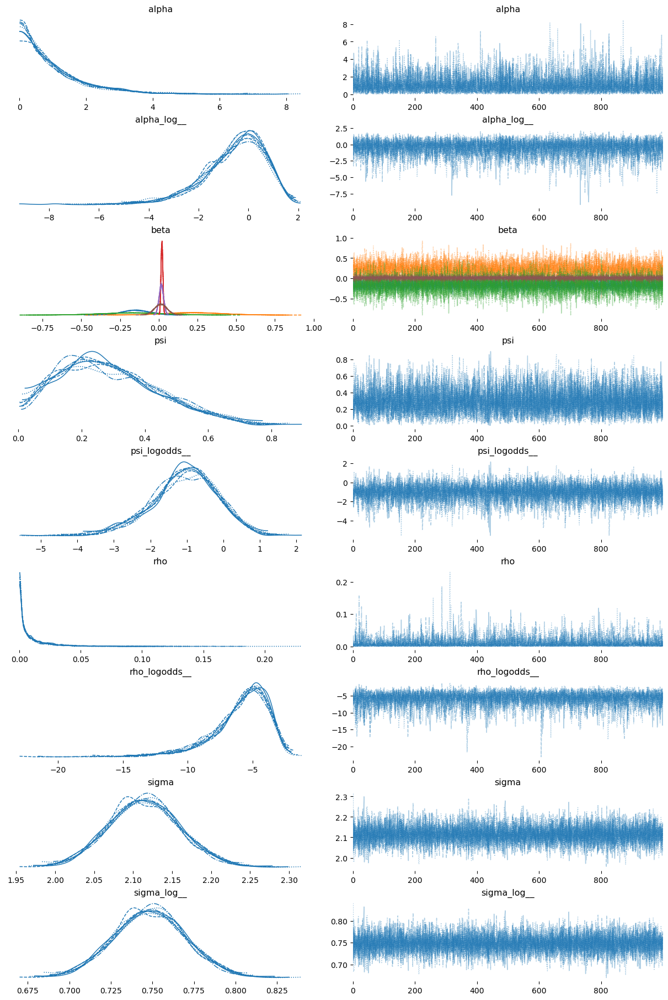

In [65]:
az.plot_trace(version_0_model_Climatological_idata, var_names = ["~country_effect", "~country_effect_offset", "~theta", 
                                                        "~phi", "~mixture", "~mu"]);

### PPC

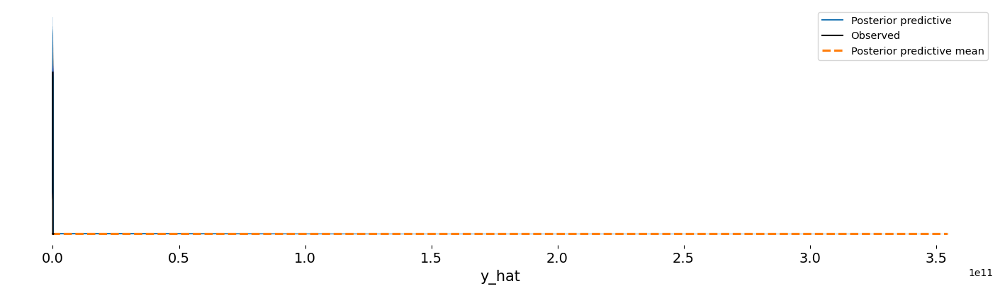

In [66]:
az.plot_ppc(version_0_model_Climatological_idata);

### Posterior

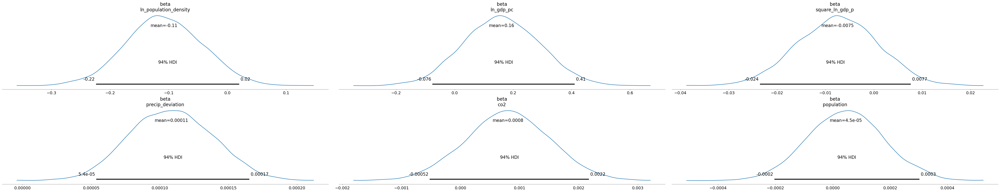

In [67]:
#To de-normalize the parameters
az.plot_posterior((version_0_model_Climatological_idata.posterior.beta / standard_deviations[features_0C].values).astype(float) ,
                  var_names=["beta"]);

###  inverse cdf uniform transform plot

In [209]:
np.linalg.inv(x @ y)

array([[ 0.5632874 , -5.39001672, 10.21635892,  2.47660977,  4.74352805],
       [ 0.28296332, -3.88270558,  7.32038564,  1.59422423,  3.17159104],
       [-0.17903975,  2.32379395, -5.10155871, -1.58924319, -2.77388331],
       [ 0.14014973, -0.95857454,  1.59897437,  0.0543267 ,  0.8035985 ],
       [-0.13347209,  0.80503567, -1.27638677,  0.07669218, -0.16375722]])

In [210]:
np.linalg.inv(y) @ np.linalg.inv(x)

array([[ 0.5632874 , -5.39001672, 10.21635892,  2.47660977,  4.74352805],
       [ 0.28296332, -3.88270558,  7.32038564,  1.59422423,  3.17159104],
       [-0.17903975,  2.32379395, -5.10155871, -1.58924319, -2.77388331],
       [ 0.14014973, -0.95857454,  1.59897437,  0.0543267 ,  0.8035985 ],
       [-0.13347209,  0.80503567, -1.27638677,  0.07669218, -0.16375722]])

C:\Users\camil\AppData\Local\Temp\ipykernel_46464\368484784.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


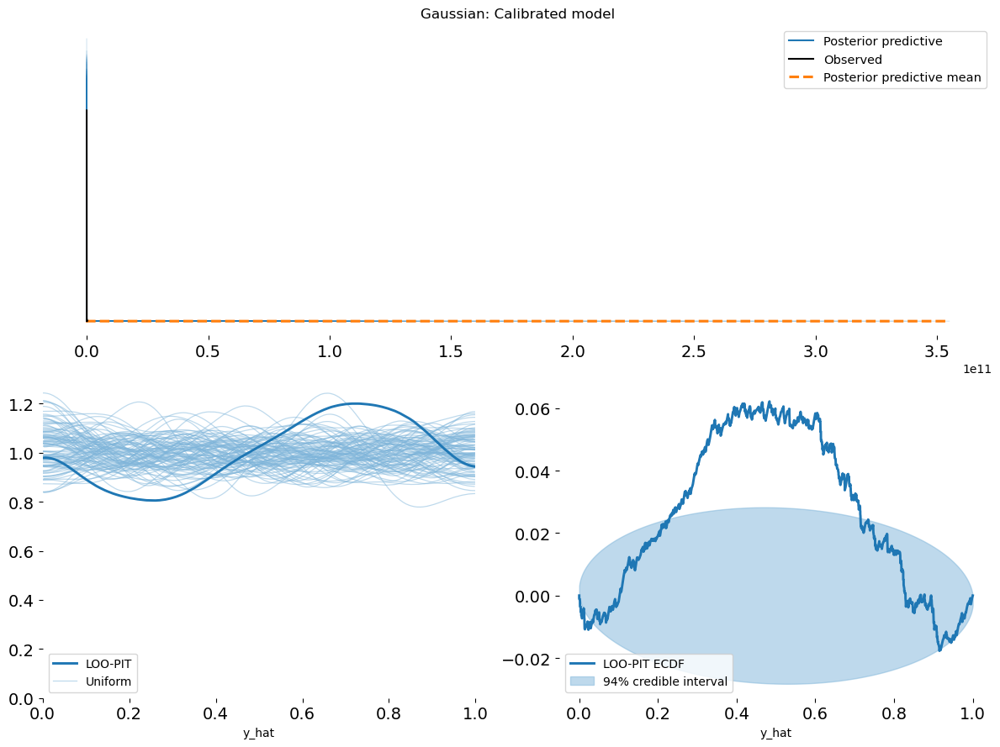

In [68]:
plot_ppc_loopit(version_0_model_Climatological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

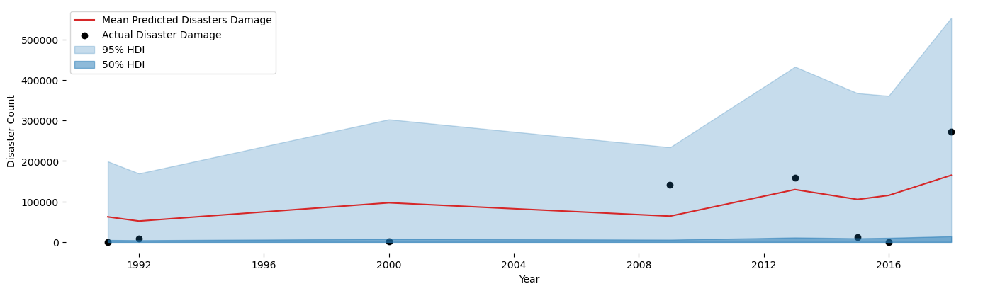

In [69]:
plotting_function(idata = version_0_model_Climatological_idata,
                  disaster_type = "climatological",
                  country= "LAO")